# Pneumonia Classification from Chest X-Ray Images Using FastAI Transfer Learning

## Introduction

This project leverages deep learning to automate the detection of pneumonia in chest X-ray images and further classify it into bacterial or viral subtypes.


### Data Sources




- [Kaggle - Chest X-Ray Images (Pneumonia)](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia/data) dataset, containing approximately 5,800 chest X-ray images.

**Important**: Extract the downloaded `chest_xray` folder into the `data` directory with the following structure: `data/chest_xray/train|val|test/NORMAL|PNEUMONIA/`.

### Methodology



We will use a **two-stage pipeline** designed for high-sensitivity screening followed by focused subtype classification:

- **Stage 1: Pneumonia Detection (Normal vs. Pneumonia)**
  - Utilizes a ResNet-50 model with transfer learning.
  - Prioritizes sensitivity (recall) to minimize missed cases.

- **Stage 2: Pneumonia Classification (Bacterial vs. Viral)**
  - Analyzes images flagged by Stage 1 to distinguish bacterial from viral pneumonia.
  - Reuses the trained backbone from Stage 1 via transfer learning.

**Image Preprocessing and Evaluation:**  
We will evaluate both stages using two types of image inputs:

**Image Preprocessing and Evaluation**:
We evaluate both stages using two input types:
- Original images with grayscale conversion (baseline).
- CLAHE-enhanced images with Hot colormap:
  - [CLAHE](https://en.wikipedia.org/wiki/Adaptive_histogram_equalization) boosts local contrast.
  - [Hot colormap](https://pmc.ncbi.nlm.nih.gov/articles/PMC5148121/) enhances feature visibility.

### References

This project uses code and ideas from the following sources:

1. Howard, J., & Gugger, S. (2020). *Deep Learning for Coders with FastAI and PyTorch*.
   O'Reilly Media.

2. Waheed, S., Ghosh, S., & Gadekallu, T. R. (2022). Pre-processing methods in chest X-ray
   image classification. *Frontiers in Medicine*, 9, 898289.
   https://doi.org/10.3389/fmed.2022.898289

3. He, K., Zhang, X., Ren, S., & Sun, J. (2016). Deep residual learning for image recognition.
   *IEEE Conference on Computer Vision and Pattern Recognition*, 770-778.

4.  Panwar, H. et al. (2020). A deep learning and grad-CAM based color visualization approach for fast detection of COVID-19 cases using chest X-ray and CT-Scan images. Chaos Solitons Fractals, 140, 110190. https://pmc.ncbi.nlm.nih.gov/articles/PMC7413068/

---

## Setup

### Load Libraries and Initial Environment Variables

In [1]:
import pandas as pd
import numpy as np
import os
from pathlib import Path
from joblib import Parallel, delayed
import multiprocessing
import random

# Plots
import seaborn as sns
import matplotlib.pyplot as plt


# Image processing
from PIL import Image, ImageStat
from skimage import io, measure, exposure, img_as_ubyte
from skimage import color as skcolor
import cv2

# Machine learning
from fastai.vision.all import *
from fastcore.all import *
from fastai.metrics import *
import torch
from torchvision.ops import sigmoid_focal_loss
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split
from sklearn.utils import class_weight, resample
from sklearn.metrics import accuracy_score,roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.calibration import calibration_curve


# Pandas settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False



In [2]:
PROJECT_PATH = '../'

Mount Google drive in google colab (skip if running locally)

In [3]:
from google.colab import drive

#Check if drive is already mounted
if not os.path.exists("/content/drive/MyDrive"):
  print("Mounting Google Drive...")
  drive.mount("/content/drive")
  print("✓ Drive mounted successfully!")
else:
  print("✓ Drive already mounted")

## Set project path for Github repo on Google Drive
PROJECT_PATH = '/content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/'

Mounting Google Drive...
Mounted at /content/drive
✓ Drive mounted successfully!


In [4]:
#PROJECT_PATH = r'C:\path\to\your\project'  # Uncomment and set this path if running locally

### Define Common Variables

In [44]:
import os
import sys

# Set up working directories

DATA_PATH = os.path.join(PROJECT_PATH, 'data')
MODEL_PATH = os.path.join(PROJECT_PATH, 'models')
CODE_PATH = os.path.join(PROJECT_PATH, 'code')
DEPLOYMENT_PATH = os.path.join(PROJECT_PATH, 'deployment')


# Add CODE_PATH to sys.path if it's not already there
if CODE_PATH not in sys.path:
    sys.path.insert(0, CODE_PATH) # Insert at the beginning to prioritize it
if DEPLOYMENT_PATH not in sys.path:
    sys.path.insert(0, DEPLOYMENT_PATH) # Insert at the beginning to prioritize it



print(f'Project path: {PROJECT_PATH}')
print(f'Data will be saved to: {DATA_PATH}')
print(f'Models will be saved to: {MODEL_PATH}')
print(f'Code modules will be loaded from: {CODE_PATH}')

images_original_path = DATA_PATH + '/chest_xray'

# Common variables
metrics = ['contrast', 'entropy', 'signal_noise_ratio', 'mean']
image_classes = ['normal', 'pneumonia']
image_subclasses = ['bacterial', 'viral']

num_cores = multiprocessing.cpu_count()

Project path: /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/
Data will be saved to: /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/data
Models will be saved to: /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/models
Code modules will be loaded from: /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/code


### Define Image Transformation Module

Define the image transformation functions and classes in `custom_transforms.py` for reuse in deployment.


In [6]:
%%writefile {CODE_PATH}/custom_transforms.py

import numpy as np
import cv2
import random
import torch
from fastai.vision.all import PILImage, ItemTransform

# Image Transformation Settings
CLAHE_CLIP_LIMIT = 2.0
CLAHE_TILE_GRID_SIZE = (8, 8)
CLAHE_IMAGE_BLUR = 7

COLORMAP_SELECTION = 'HOT'

class EnsureGrayscale(ItemTransform):
  """Convert image to grayscale using pure numpy, then to 3-channel for ResNet"""

  def __repr__(self):
      return f"{self.__class__.__name__}()"

  def encodes(self, x):
      is_tuple = isinstance(x, (tuple, list))
      img = x[0] if is_tuple else x
      label = x[1] if is_tuple and len(x) > 1 else None

      arr = np.array(img)

      # Convert to grayscale using numpy formula
      if len(arr.shape) == 2:
          # Already grayscale
          arr_gray = arr
      elif len(arr.shape) == 3:
          # RGB to grayscale: 0.299*R + 0.587*G + 0.114*B
          arr_gray = np.dot(arr[...,:3], [0.299, 0.587, 0.114]).astype(np.uint8)
      else:
          arr_gray = arr

      # Replicate to 3 channels for ResNet
      arr_3ch = np.stack([arr_gray, arr_gray, arr_gray], axis=-1)
      res = PILImage.create(arr_3ch)

      if label is not None:
          return (res, label)
      else:
          return (res,)


# Apply CLAHE to grayscale image
class CLAHETransform(ItemTransform):

    def __init__(self, p=1.0):
        self.clip_limit = CLAHE_CLIP_LIMIT
        self.tile_grid_size = CLAHE_TILE_GRID_SIZE
        self.medianBlur = CLAHE_IMAGE_BLUR
        self.p = p

    def __repr__(self):
      return (f"{self.__class__.__name__}("
              f"clip_limit={self.clip_limit}, "
              f"tile_grid_size={self.tile_grid_size}, "
              f"medianBlur={self.medianBlur}, "
              f"p={self.p})")

    def encodes(self, x):
        is_tuple = isinstance(x, (tuple, list))
        img = x[0] if is_tuple else x
        label = x[1] if is_tuple and len(x) > 1 else None

        if random.random() > self.p:
            return x

        arr = np.array(img)

        # Get grayscale
        if len(arr.shape) == 2:
            gray = arr
        elif len(arr.shape) == 3:
            gray = np.dot(arr[...,:3], [0.299, 0.587, 0.114]).astype(np.uint8)
        else:
            gray = arr

        gray = cv2.medianBlur(gray, self.medianBlur)
        # Apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)

        gray = clahe.apply(gray)

        # Replicate to 3 channels
        arr_3ch = np.stack([gray, gray, gray], axis=-1)
        res = PILImage.create(arr_3ch)

        if label is not None:
            return (res, label)
        else:
            return (res,)

# Apply colormap to grayscale image
class ColormapTransform(ItemTransform):
    """Apply colormap to grayscale image"""
    def __init__(self, p=1.0, colormap=COLORMAP_SELECTION):
        self.colormap = colormap
        self.p = p
        self.cv2_colormaps = {
            'JET': cv2.COLORMAP_JET,
            'HOT': cv2.COLORMAP_HOT,
            'VIRIDIS': cv2.COLORMAP_VIRIDIS,
            'PLASMA': cv2.COLORMAP_PLASMA,
            'OCEAN': cv2.COLORMAP_OCEAN,
            'BONE': cv2.COLORMAP_BONE,
            'WINTER': cv2.COLORMAP_WINTER,
            'INFERNO': cv2.COLORMAP_INFERNO,
            'MAGMA': cv2.COLORMAP_MAGMA,
        }

    def encodes(self, x):
        is_tuple = isinstance(x, (tuple, list))
        img = x[0] if is_tuple else x
        label = x[1] if is_tuple and len(x) > 1 else None

        if random.random() > self.p:
            return x

        arr = np.array(img)

        # Get grayscale
        if len(arr.shape) == 2:
            gray = arr
        else:
            gray = cv2.cvtColor(arr, cv2.COLOR_RGB2GRAY)

        # Normalize to 0-255 if needed
        if gray.dtype != np.uint8:
            gray = ((gray - gray.min()) / (gray.max() - gray.min()) * 255).astype(np.uint8)

        # Apply colormap
        if self.colormap in self.cv2_colormaps:
            colored = cv2.applyColorMap(gray, self.cv2_colormaps[self.colormap])
            colored = cv2.cvtColor(colored, cv2.COLOR_BGR2RGB)
        else:
            colored = np.stack([gray, gray, gray], axis=-1)

        res = PILImage.create(colored)

        if label is not None:
            return (res, label)
        else:
            return (res,)
    def __repr__(self):
      return (f"{self.__class__.__name__}("
              f"colormap='{self.colormap}', "
              f"p={self.p})")


# Loss function with focus on most difficult images
class FastFocalLoss(torch.nn.Module):
    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean'):
        """
        alpha: float or 1D tensor of shape [num_classes]
        gamma: focusing parameter
        """
        super().__init__()
        # register alpha as buffer so it moves with the module to cuda
        if isinstance(alpha, (list, tuple)):
            alpha = torch.tensor(alpha, dtype=torch.float)
        self.register_buffer('alpha', torch.tensor(alpha, dtype=torch.float))
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, logits, targets):

        logp = torch.nn.functional.log_softmax(logits, dim=1)
        logp_t = logp.gather(1, targets.unsqueeze(1)).squeeze(1)
        p_t = logp_t.exp()

        # alpha per sample
        if self.alpha.ndim == 0:
            alpha_t = self.alpha
        else:
            alpha_t = self.alpha[targets]

        focal_loss = -alpha_t * (1 - p_t) ** self.gamma * logp_t

        if self.reduction == 'mean':
            return focal_loss.mean()
        if self.reduction == 'sum':
            return focal_loss.sum()
        return focal_loss

    def activation(self, x):
        return torch.nn.functional.softmax(x, dim=1)

    def decodes(self, x):
        return x.argmax(dim=1)

Overwriting /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/code/custom_transforms.py


### Define Helper Functions for Image Categorization and Processing

In [7]:
# Image classification functions
def image_class_function(orig_file_path):
  file_path_str = str(orig_file_path)
  if 'NORMAL' in file_path_str.upper():
    return 'normal'
  elif 'VIRUS' in file_path_str.upper() or 'BACTERIA' in file_path_str.upper() :
    return 'pneumonia'
  else:
    return None

def image_usage_function(orig_file_path) :
  file_path_str = str(orig_file_path).upper()
  if 'TEST' in file_path_str:
    return 'test'
  elif 'TRAIN' in file_path_str:
    return 'train'
  #merge with train
  elif 'VAL' in file_path_str:
    return 'train'
  else :
    return None

def image_subclass_function(orig_file_path):
  file_path_str = str(orig_file_path)
  if 'BACTERIA' in file_path_str.upper():
    return 'bacterial'
  elif 'VIRUS' in file_path_str.upper():
    return 'viral'
  else:
    return None

def image_absolute_path_function(orig_file_path):
  return os.path.join(PROJECT_PATH, orig_file_path)

# Visualization helper function

## Plot metrics by image classification (normal vs pneumonia) or by subclass (bacterial vs viral)
def plot_metrics_by_class(df, metrics, classes, class_column='image_class',
                          title_prefix="", color_map=None):

    plt.figure(figsize=(15, 6))
    for i in range(len(metrics)):
        plt.subplot(1, 4, i + 1)
        for cls in classes:
            vals = df[df[class_column] == cls][metrics[i]].dropna()
            color = color_map.get(cls, None) if color_map else None
            sns.histplot(
                vals,
                bins=40,
                label=cls,
                alpha=0.6,
                linewidth=1,
                stat='density',
                common_norm=False,
                color=color
            )
        title = f'{title_prefix}{metrics[i].capitalize()} by {class_column.replace("_", " ").title()}'
        plt.title(title, fontsize=14)
        plt.xlabel(metrics[i].capitalize(), fontsize=12)
        plt.ylabel('Density', fontsize=12)
        plt.legend()
    plt.tight_layout()
    plt.show()


def print_learner_config(learn):
    lf = learn.loss_func
    print("=== Loss ===")
    print(f"Loss func  : {lf.__class__.__name__}")

    if isinstance(lf, CrossEntropyLossFlat):
        if hasattr(lf.func, "weight"):
          print("raw weight:", lf.func.weight)
    elif isinstance(lf, FastFocalLoss):
        if lf.alpha is not None:
            a = lf.alpha.detach().cpu().numpy()
            print(f"  alpha          : {a}")
        if lf.gamma is not None:
            g = lf.gamma
            print(f"  gammma         : {g}")
    else:
        print("  (generic loss; params from __dict__)")
        for k, v in lf.__dict__.items():
            if isinstance(v, torch.Tensor):
                v = v.detach().cpu().numpy()
            print(f"    {k}: {v}")

    print("\n=== Optimizer & training ===")
    wd = learn.wd if learn.wd is not None else 1e-2
    print(f"Weight decay (wd): {wd}")

    print("\n=== Dropout in model head ===")
    for m in learn.model.modules():
        if isinstance(m, nn.Dropout):
            print(f"  Dropout p={m.p}")

    print("\n=== Data & augmentations ===")
    print(f"Batch size : {learn.dls.bs}")
    print(f"Train batches: {len(learn.dls.train)}, Valid batches: {len(learn.dls.valid)}")
    print("Item tfms  :")
    for t in learn.dls.after_item:
        print(f"  - {t}")

    print("Batch tfms :")
    for t in learn.dls.after_batch:
        print(f"  - {t}")

from custom_transforms import EnsureGrayscale, CLAHETransform, ColormapTransform, FastFocalLoss

def compute_metrics_with_transform(img_path, transforms=None):
    abs_path = os.path.join(PROJECT_PATH, img_path)
    img = PILImage.create(abs_path)

    width, height = img.size

    if transforms is None:
        transforms = []
    else:
        transforms = [transforms]

    lbl = ''
    for t in transforms:
        res_obj = t.encodes((img, lbl))
        if isinstance(res_obj, (tuple, list)) and len(res_obj) == 2:
            img, lbl = res_obj
        elif isinstance(res_obj, (tuple, list)) and len(res_obj) == 1:
            img = res_obj[0]
        else:
            img = res_obj


    arr = np.array(img)
    # If arr is RGB, convert to grayscale using the standard weights:
    if arr.ndim == 3:
          arr = np.dot(arr[...,:3], [0.299, 0.587, 0.114])
    arr = arr.astype(np.float64)  # prevent overflow

    mean = np.mean(arr)

    contrast = np.std(arr)

    # Entropy
    hist, bins = np.histogram(arr, bins=256, range=(0,255), density=True)
    hist = hist[hist > 0]  # remove zeros to avoid log(0)
    entropy = -np.sum(hist * np.log2(hist))

    signal_noise_ratio = mean / (contrast + 1e-8)

    return {
        'orig_file_path': img_path,
        'mean': mean,
        'contrast': contrast,
        'entropy': entropy,
        'signal_noise_ratio': signal_noise_ratio,
        'width': width,
        'height': height
    }




### Change the Runtime

Change the Runtime to utilize the NVIDIA T4 GPU, if it is not already set to the GPU.

In the menu above click
Runtime $\rightarrow$ Change runtime type and change Hardware accelerator to T4 GPU

---

## Exploratory Data Analysis

Our exploratory data analysis examines sample images, analyzes statistics (contrast, entropy, signal-to-noise ratio), and identifies low-quality samples to ensure a clean dataset.

### Load and Catalog Chest X-Ray Images

From the Kaggle Pneumonia dataset, we catalog all images by extracting metadata and computing metrics.

**Get the file names for each image**

In [ ]:
allowed_extensions = ['.jpg', '.jpeg', '.png']

absolute_image_file_paths = get_image_files(DATA_PATH+'/chest_xray')

# Filter for specific image extensions
absolute_image_file_paths = [f for f in absolute_image_file_paths if f.suffix.lower() in allowed_extensions]

image_file_paths = [str(f.relative_to(PROJECT_PATH)) for f in absolute_image_file_paths]
print("Number of images",len(image_file_paths))

Number of images 5856


Build a pandas DataFrame to systematically organize all images with their metadata.

In [ ]:

df = pd.DataFrame([str(f) for f in image_file_paths], columns=['orig_file_path'])
df['file_name'] = df['orig_file_path'].apply(lambda x: os.path.basename(x))
df['image_class'] = df['orig_file_path'].apply(image_class_function)
df['image_subclass'] = df['orig_file_path'].apply(image_subclass_function)
df['usage_type'] = df['orig_file_path'].apply(image_usage_function)

# Filter out rows where image_class or usage_type is None
df.dropna(subset=['image_class', 'usage_type'], inplace=True)

# Group by usage_type, image_class, and image_subclass and count the filenames, including NaN values in the grouping
df.groupby(['usage_type', 'image_class', 'image_subclass'], dropna=False)['file_name'].count()

usage_type  image_class  image_subclass
test        normal       NaN                234
            pneumonia    bacterial          242
                         viral              148
train       normal       NaN               1349
            pneumonia    bacterial         2538
                         viral             1345
Name: file_name, dtype: int64

We can notice that we have almost 2x pneumonia-bacteria images than normal and pneumonia-virus. We will need to handle that discrepancy for training set.

### Show Sample Images

Sample images reveal clear visual differences: pneumonia cases show opacity, while normal lungs appear clear. Viral and bacterial pneumonia appear similar, with subtle differences.


Image classification - pneumonia or normal


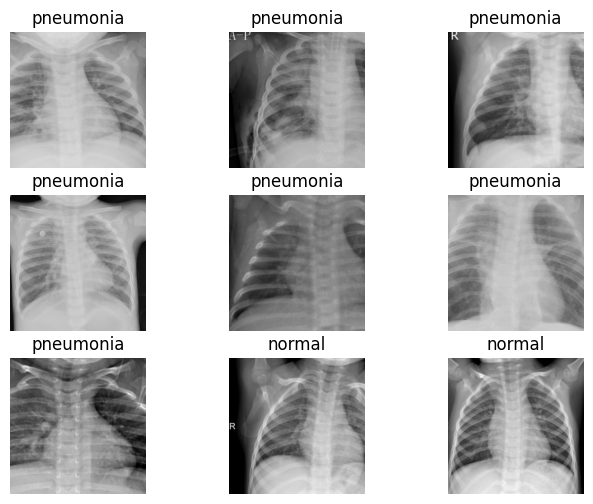

In [ ]:
from matplotlib.typing import path
# Set up a new DataBlock for 2-class classification (Normal, Pneumonia)
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    # This applies the lambda function to each DataFrame row
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader('image_class'),
    item_tfms=Resize(224)
)

# Create DataLoaders for the 2-class classification task
dls = dblock.dataloaders(df)
print("Image classification - pneumonia or normal")
dls.show_batch(figsize=(8, 6))

Sample images illustrate clear visual differences between normal lungs and those with pneumonia. Pneumonia images typically show areas of opacity or cloudiness, whereas normal images display clear lung fields.

Pneumonia image sub classification: viral and bacterial


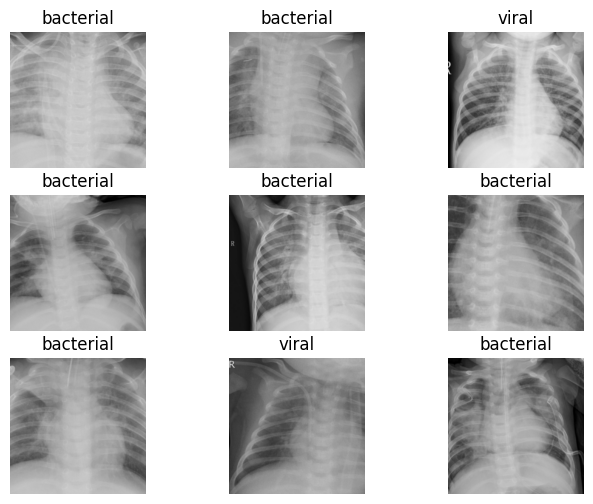

In [ ]:
# Create a DataFrame for pneumonia images
df_pneumonia = df[df['image_class'] == 'pneumonia']

# Set up a new DataBlock for 2-sub classification (Bacterial, Viral)
dblock_sub = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader('image_subclass'),
    item_tfms=Resize(224)
)

# Create DataLoaders for the 3-class classification task
dls_sub = dblock_sub.dataloaders(df_pneumonia)

print("Pneumonia image sub classification: viral and bacterial")

dls_sub.show_batch(figsize=(8, 6))

Viral and bacterial pneumonia often look quite similar in X-ray images, with differences that are subtle and harder to spot.

### Calculate Image Statistics

We compute contrast, entropy, and signal-to-noise ratio for every X-ray to evaluate quality and compare classes.

In [ ]:
from pathlib import Path
import seaborn as sns
import random
from collections import Counter
import os

image_classes = df['image_class'].unique()
image_subclasses = df['image_subclass'].dropna().unique()
metrics = ['contrast', 'entropy', 'signal_noise_ratio', 'mean']
metrics_file = os.path.join(DATA_PATH, 'xray_images_metrics.csv')

# Check if metrics file exists, and skip computation if it does
if os.path.exists(metrics_file):
    print(f"Loading metrics from {metrics_file}")
    df_metrics = pd.read_csv(metrics_file)
else:
    # Use all available CPUs

    print("\nNumber of available CPUs",num_cores)
    print("\n\n Compute Image Statistics...")
    results = Parallel(n_jobs=num_cores)(
        delayed(compute_metrics_with_transform)(f) for f in df['orig_file_path']
    )

    df_metrics = pd.DataFrame(results)
    #Save the DataFrame with metrics
    df_metrics.to_csv(metrics_file, index=False)
    print(f"Metrics computed and saved to {metrics_file}")

df = df.merge(df_metrics, on='orig_file_path', how='left')
df.head()

Loading metrics from /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/data/xray_images_metrics.csv


,orig_file_path,file_name,image_class,image_subclass,usage_type,mean,contrast,entropy,signal_noise_ratio,width,height
0,data/chest_xray/test/NORMAL/IM-0001-0001.jpeg,IM-0001-0001.jpeg,normal,None,test,130.998608,57.102032,7.623622,2.294115,1857,1317
1,data/chest_xray/test/NORMAL/IM-0003-0001.jpeg,IM-0003-0001.jpeg,normal,None,test,142.445303,60.668227,7.627586,2.347939,2111,1509
2,data/chest_xray/test/NORMAL/IM-0005-0001.jpeg,IM-0005-0001.jpeg,normal,None,test,136.249559,55.404084,7.594997,2.459197,2031,1837
3,data/chest_xray/test/NORMAL/IM-0006-0001.jpeg,IM-0006-0001.jpeg,normal,None,test,148.670080,42.324957,7.350563,3.512587,1663,1326
4,data/chest_xray/test/NORMAL/IM-0007-0001.jpeg,IM-0007-0001.jpeg,normal,None,test,137.699779,53.966271,7.659481,2.551590,2053,1818


### Plot Image Statistics

Visualize distributions to assess quality and identify class differences.

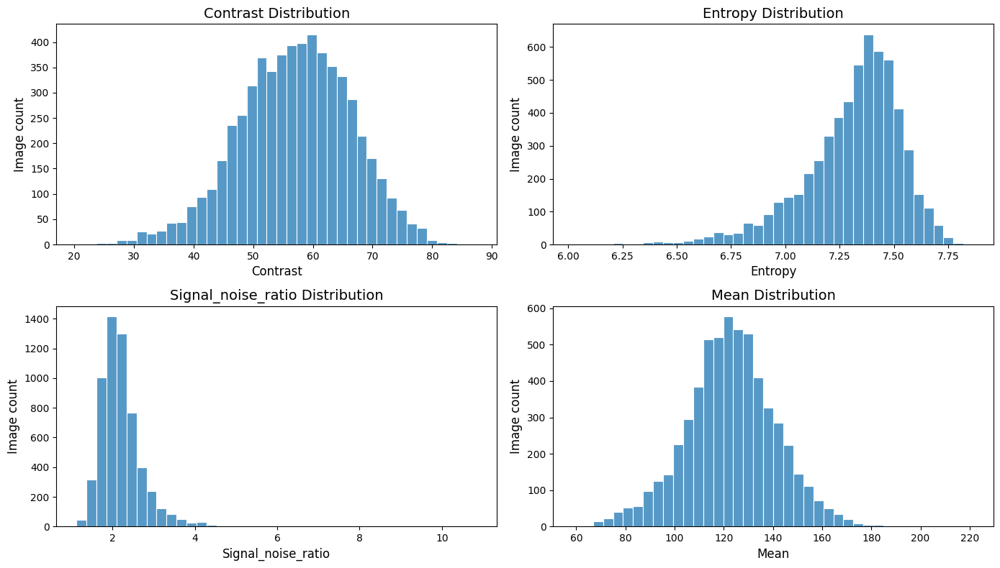

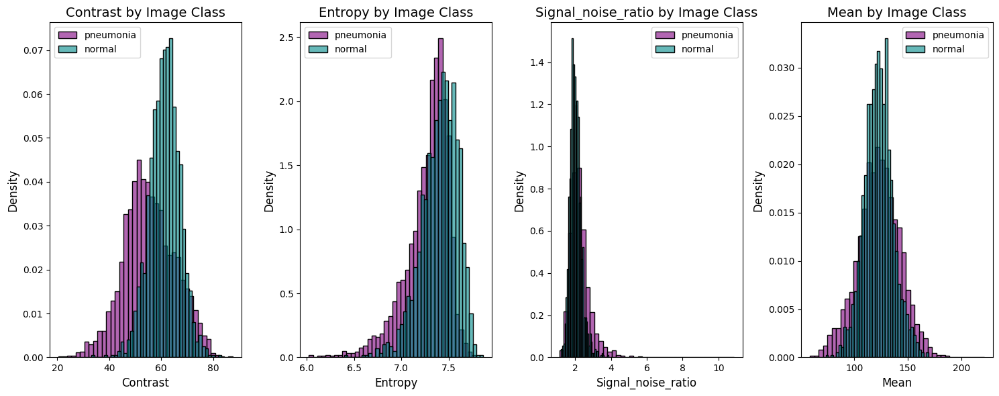

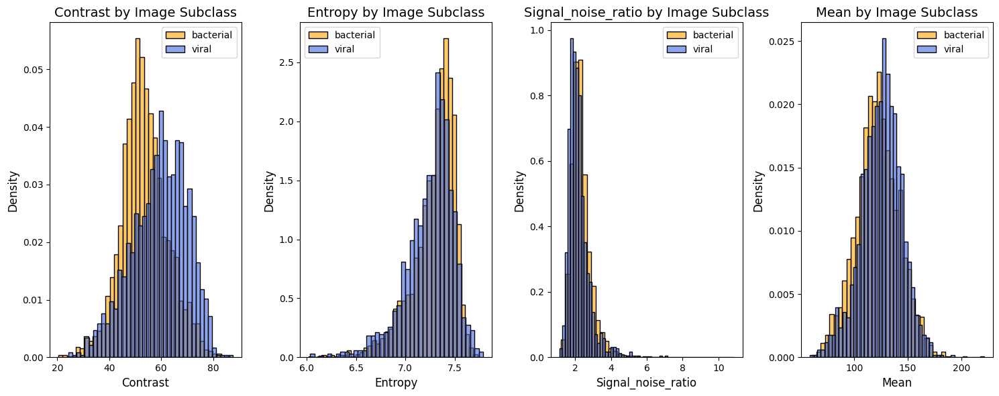

In [ ]:
#Plot diagrams for each metric
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
for i in range(len(metrics)):
    plt.subplot(2, 2, i + 1)
    sns.histplot(
        df[metrics[i]].dropna(),
        bins=40,
        edgecolor='white'
    )
    plt.title(f'{metrics[i].capitalize()} Distribution', fontsize=14)
    plt.xlabel(metrics[i].capitalize(), fontsize=12)
    plt.ylabel('Image count', fontsize=12)
plt.tight_layout()
plt.show()


# Plot diagrams for each image-class (using helper function)
class_color_map = {
    'pneumonia': 'purple',
    'normal': 'darkcyan',
}

plot_metrics_by_class(df, metrics, ['pneumonia', 'normal'],
                      class_column='image_class',
                      color_map=class_color_map)

# Plot diagrams for each image-subclass (using helper function)
class_color_map = {
    'bacterial': 'orange',
    'viral': 'royalblue',
}

plot_metrics_by_class(df, metrics, image_subclasses,
                      class_column='image_subclass',
                      color_map=class_color_map)

Across image classes, the histograms show moderate contrast, entropy, and mean, while the signal-to-noise ratio is right-skewed, indicating a few exceptionally clean scans. Outliers with very low contrast or mean flag low-quality images. Comparing pneumonia to normal cases, pneumonia images exhibit slightly higher average contrast and entropy. Viral and bacterial pneumonia histograms look nearly identical across metrics, with only subtle differences.


### Identify and Remove Low-Quality Images

**Identify small images**

Since our pre-trained model expects 224×224 inputs, we remove images smaller than this threshold.

In [ ]:
## Identify smaller images than ImageNet(244)
size_threshold = 244
small_img = df[(df['width'] < size_threshold) | (df['height'] < size_threshold)]
small_img.describe()

,mean,contrast,entropy,signal_noise_ratio,width,height
count,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000
mean,132.656973,45.955423,7.002872,2.999987,470.711538,191.865385
std,15.740903,8.647248,0.277183,0.780958,39.086298,30.943990
min,71.142924,27.907264,6.362827,1.930794,384.000000,127.000000
25%,122.345411,40.335480,6.856465,2.522469,445.000000,172.750000
50%,134.517138,45.055093,7.034936,2.882159,464.500000,189.500000
75%,142.962274,52.096492,7.203138,3.171104,492.500000,218.250000
max,172.314810,67.581674,7.472790,5.536823,564.000000,242.000000


In [ ]:
print("\nTotal number of images to remove",len(small_img))
df_clean = df[~df['orig_file_path'].isin(small_img['orig_file_path'])]
df_clean =  df_clean.reset_index(drop=True)


Total number of images to remove 52


Save dataset after removal of low quality images

In [ ]:
df_clean.to_csv(os.path.join(DATA_PATH, 'df_clean.csv'),index=False)

df_clean.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5804 entries, 0 to 5803
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   orig_file_path      5804 non-null   object 
 1   file_name           5804 non-null   object 
 2   image_class         5804 non-null   object 
 3   image_subclass      4221 non-null   object 
 4   usage_type          5804 non-null   object 
 5   mean                5804 non-null   float64
 6   contrast            5804 non-null   float64
 7   entropy             5804 non-null   float64
 8   signal_noise_ratio  5804 non-null   float64
 9   width               5804 non-null   int64  
 10  height              5804 non-null   int64  
dtypes: float64(4), int64(2), object(5)
memory usage: 498.9+ KB


In [ ]:

df_clean.groupby(['usage_type', 'image_class', 'image_subclass'], dropna=False)['orig_file_path'].count()

usage_type  image_class  image_subclass
test        normal       NaN                234
            pneumonia    bacterial          242
                         viral              148
train       normal       NaN               1349
            pneumonia    bacterial         2508
                         viral             1323
Name: orig_file_path, dtype: int64

---

## Prepare and Analyze Training Data

All chest X-rays are converted to grayscale, normalized, and replicated across three channels for ResNet-50 compatibility. **Training Set 1** serves as a baseline. **Training Set 2** adds CLAHE and Hot colormap enhancements.


In [ ]:
## Load cleaned images data
df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))

# function to construct image path from image classification
def get_img_processed_dest_path(row, base_dir):
    parts = [
        base_dir,
        str(row['usage_type']),
        str(row['image_class']),
        str(row['file_name'])
    ]
    return os.path.join(*parts)




In [ ]:
# Group by usage_type, image_class, and image_subclass and count the filenames, including NaN values in the grouping
df_clean.groupby(['usage_type', 'image_class', 'image_subclass'], dropna=False)['file_name'].count()

usage_type  image_class  image_subclass
test        normal       NaN                234
            pneumonia    bacterial          242
                         viral              148
train       normal       NaN               1349
            pneumonia    bacterial         2508
                         viral             1323
Name: file_name, dtype: int64


**Note**: Significant class imbalance exists and will be addressed during training.

### Set 1 Preparation


Training Set 1 uses grayscale-converted images only, providing a baseline.

**We start with clean dataset and drop metrics, which will be recalculated after grayscale conversion**

In [ ]:
df_training_set1 = df_clean.copy()

#drop metrics to recalculate them after transformation
df_training_set1.drop(columns=['contrast', 'entropy','mean', 'signal_noise_ratio', 'width', 'height'], inplace=True)

df_training_set1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5804 entries, 0 to 5803
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   orig_file_path  5804 non-null   object
 1   file_name       5804 non-null   object
 2   image_class     5804 non-null   object
 3   image_subclass  4221 non-null   object
 4   usage_type      5804 non-null   object
dtypes: object(5)
memory usage: 226.8+ KB


#### Compute Statistics Training for Set 1 with Grayscale Filter

In [ ]:
df_training_set1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5804 entries, 0 to 5803
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   orig_file_path  5804 non-null   object
 1   file_name       5804 non-null   object
 2   image_class     5804 non-null   object
 3   image_subclass  4221 non-null   object
 4   usage_type      5804 non-null   object
dtypes: object(5)
memory usage: 226.8+ KB


#### Plot Training Set 1 Statistics

In [ ]:
from pathlib import Path
import seaborn as sns
import random
from collections import Counter
import os

image_classes = df_training_set1['image_class'].unique()
image_subclasses = df_training_set1['image_subclass'].dropna().unique()
metrics = ['contrast', 'entropy', 'signal_noise_ratio', 'mean']
metrics_file_set1 = os.path.join(DATA_PATH, 'xray_images_metrics_set1.csv')

# Check if metrics file exists
if os.path.exists(metrics_file_set1):
    print(f"Loading metrics from {metrics_file_set1}")
    df_metrics_set1 = pd.read_csv(metrics_file_set1)
else:

    # Use all available CPUs

    print("\nNumber of available CPUs",num_cores)
    print("\n\n Compute Image Statistics...")
    tf = EnsureGrayscale()
    results = Parallel(n_jobs=num_cores)(
       delayed(compute_metrics_with_transform)(f, transforms=[tf])
        for f in df_training_set1['orig_file_path']
    )



    df_metrics_set1 = pd.DataFrame(results)

    # Save the DataFrame with metrics
    df_metrics_set1.to_csv(metrics_file_set1, index=False)
    print(f"Metrics computed and saved to {metrics_file_set1}")

df_training_set1 = df_training_set1.merge(df_metrics_set1, on='orig_file_path', how='left')
df_training_set1.head()

Loading metrics from /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/data/xray_images_metrics_set1.csv


,orig_file_path,file_name,image_class,image_subclass,usage_type,mean,contrast,entropy,signal_noise_ratio,width,height
0,data/chest_xray/test/NORMAL/IM-0001-0001.jpeg,IM-0001-0001.jpeg,normal,NaN,test,130.735686,57.106981,7.265963,2.289312,1857,1317
1,data/chest_xray/test/NORMAL/IM-0003-0001.jpeg,IM-0003-0001.jpeg,normal,NaN,test,142.187266,60.665415,7.283907,2.343795,2111,1509
2,data/chest_xray/test/NORMAL/IM-0005-0001.jpeg,IM-0005-0001.jpeg,normal,NaN,test,135.989814,55.403034,7.246311,2.454555,2031,1837
3,data/chest_xray/test/NORMAL/IM-0006-0001.jpeg,IM-0006-0001.jpeg,normal,NaN,test,148.415087,42.322906,7.010260,3.506732,1663,1326
4,data/chest_xray/test/NORMAL/IM-0007-0001.jpeg,IM-0007-0001.jpeg,normal,NaN,test,137.443083,53.962186,7.308609,2.547026,2053,1818


In this section, we visualize the distributions of key image metrics for Training Set 1.



Training Set 1


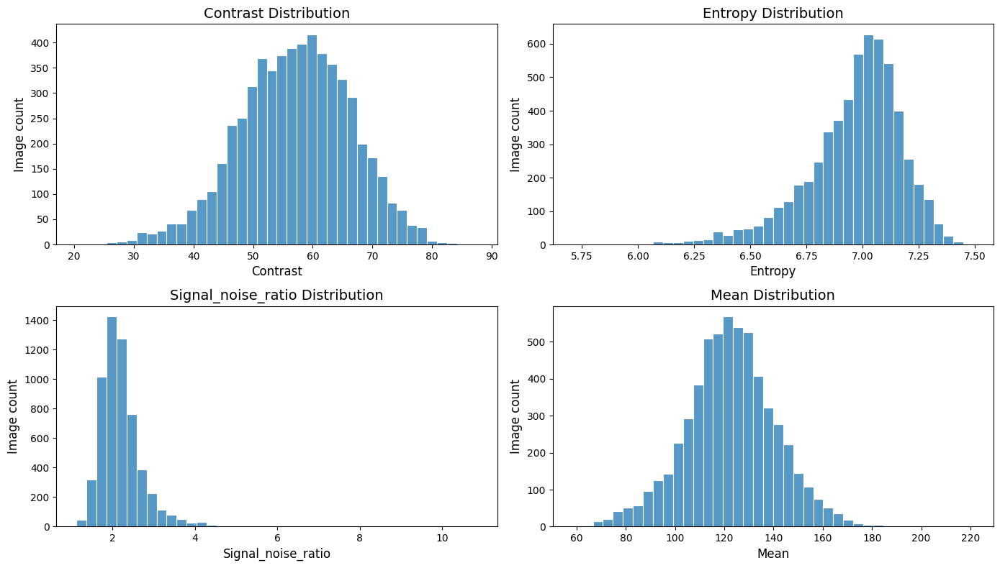

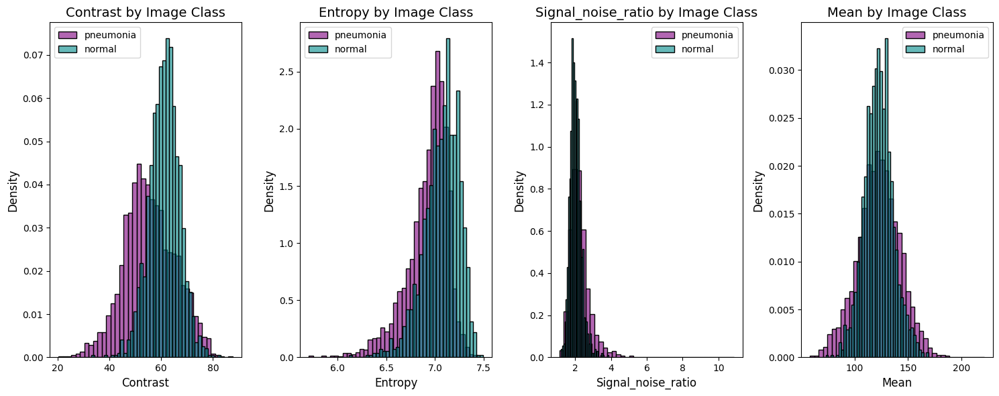

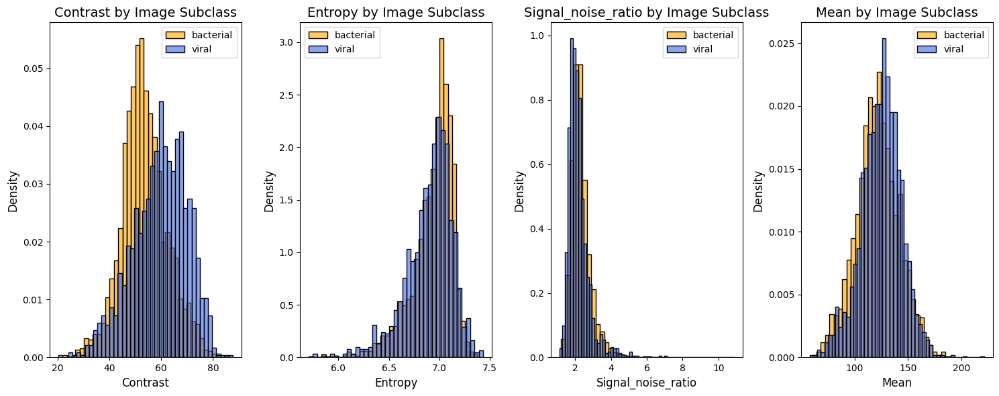

In [ ]:
#Plot diagrams for each metric
import seaborn as sns
import matplotlib.pyplot as plt


print("Training Set 1")
plt.figure(figsize=(14, 8))
for i in range(len(metrics)):
    plt.subplot(2, 2, i + 1)
    sns.histplot(
        df_training_set1[metrics[i]].dropna(),
        bins=40,
        edgecolor='white'
    )
    plt.title(f'{metrics[i].capitalize()} Distribution', fontsize=14)
    plt.xlabel(metrics[i].capitalize(), fontsize=12)
    plt.ylabel('Image count', fontsize=12)
plt.tight_layout()
plt.show()


# Plot diagrams for each image-class (using helper function)
class_color_map = {
    'pneumonia': 'purple',
    'normal': 'darkcyan',
}

plot_metrics_by_class(df_training_set1, metrics, ['pneumonia', 'normal'],
                      class_column='image_class',
                      color_map=class_color_map)

# Plot diagrams for each image-subclass (using helper function)
class_color_map = {
    'bacterial': 'orange',
    'viral': 'royalblue',
}

plot_metrics_by_class(df_training_set1, metrics, image_subclasses,
                      class_column='image_subclass',
                      color_map=class_color_map)



After converting to grayscale and removing low-quality scans, the class-level metric curves mostly overlap, with contrast standing out as the strongest differentiator.

#### Save Training Set 1 Data




In [ ]:
df_training_set1.to_csv(os.path.join(DATA_PATH, 'df_training_set1.csv'),index=False)

### Set 2 Preparation


Training Set 2 applies CLAHE for local contrast enhancement and Hot colormap to highlight patterns.

#### Compute Statistics with Applied CLAHE and Hot Colormap


In [ ]:
#configure image transformation classes

df_training_set2 = df_clean.copy()
metrics_file_set2 = os.path.join(DATA_PATH, 'xray_images_metrics_set2.csv')

#drop metrics to replace them with metrics for clahe
df_training_set2.drop(columns=['contrast', 'entropy','mean', 'signal_noise_ratio', 'width', 'height'], inplace=True)

if os.path.exists(metrics_file_set2):
    print(f"Loading metrics from {metrics_file_set2}")
    df_metrics_set2 = pd.read_csv(metrics_file_set2)
else:

    print(f"\nCPUs available: {num_cores}")

    print("\nCompute image statistics with CLAHE...")

    results = Parallel(n_jobs=num_cores)(
        delayed(compute_metrics_with_transform)(
            f,
            transforms=[EnsureGrayscale(), CLAHETransform(), ColormapTransform()]
        )
        for f in df_training_set2['orig_file_path']
    )

    df_metrics_set2 = pd.DataFrame(results)
    df_metrics_set2.to_csv(metrics_file_set2, index=False)
    print(f"Metrics saved to {metrics_file_set2}")

df_training_set2 = df_training_set2.merge(df_metrics_set2, on='orig_file_path', how='left')
df_training_set2.head()

Loading metrics from /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/data/xray_images_metrics_set2.csv


,orig_file_path,file_name,image_class,image_subclass,usage_type,mean,contrast,entropy,signal_noise_ratio,width,height
0,data/chest_xray/test/NORMAL/IM-0001-0001.jpeg,IM-0001-0001.jpeg,normal,NaN,test,117.961912,70.935172,7.535515,1.662954,1857,1317
1,data/chest_xray/test/NORMAL/IM-0003-0001.jpeg,IM-0003-0001.jpeg,normal,NaN,test,128.261761,72.839031,7.532657,1.760893,2111,1509
2,data/chest_xray/test/NORMAL/IM-0005-0001.jpeg,IM-0005-0001.jpeg,normal,NaN,test,124.704067,71.393380,7.560612,1.746718,2031,1837
3,data/chest_xray/test/NORMAL/IM-0006-0001.jpeg,IM-0006-0001.jpeg,normal,NaN,test,136.341304,64.090955,7.405120,2.127310,1663,1326
4,data/chest_xray/test/NORMAL/IM-0007-0001.jpeg,IM-0007-0001.jpeg,normal,NaN,test,124.624939,70.550699,7.554565,1.766459,2053,1818


#### Plot Training Set 2 with Applied Enhancements

Plot image metrics distributions with comparison between image classifications

Training Set 2


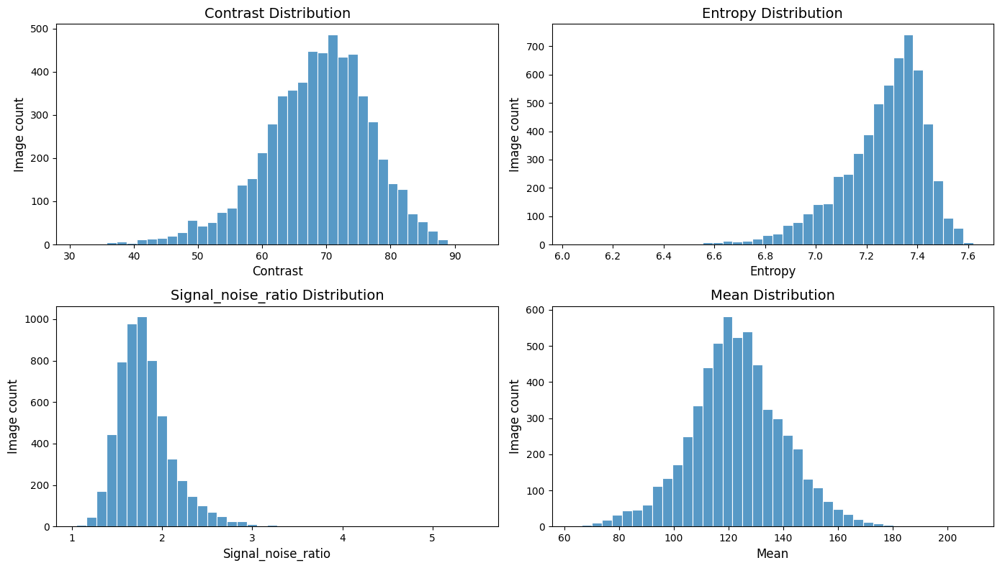

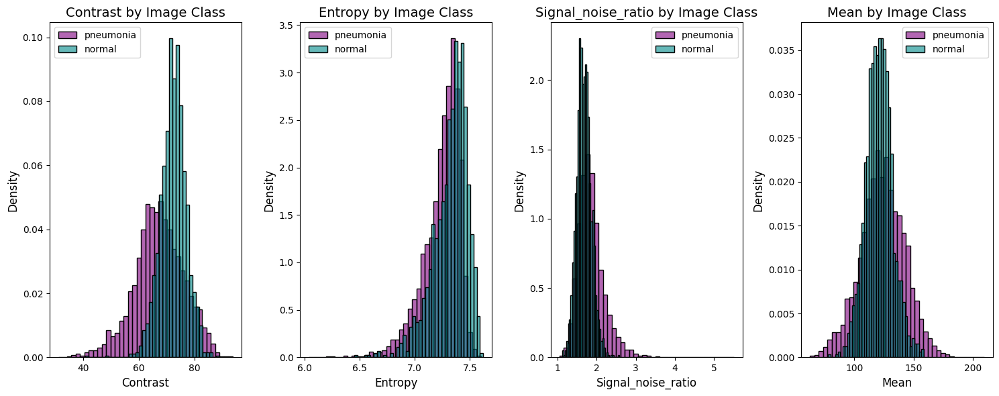

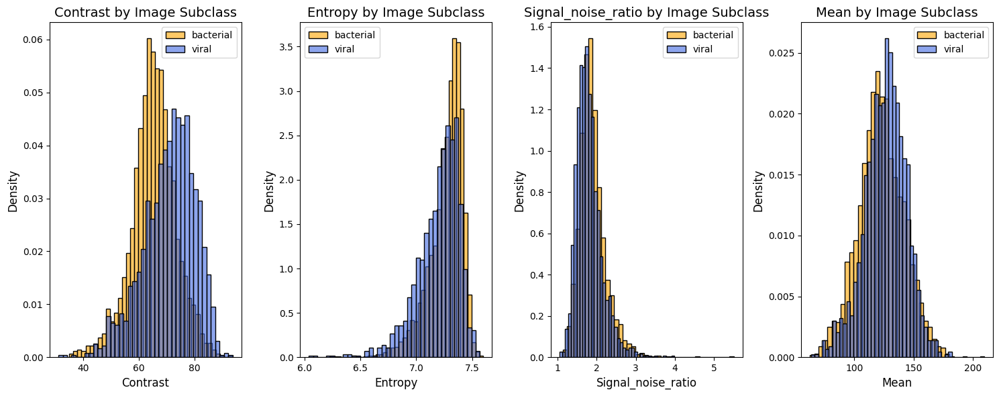

In [ ]:
#Plot diagrams for each metric
import seaborn as sns
import matplotlib.pyplot as plt

print("Training Set 2")
plt.figure(figsize=(14, 8))
for i in range(len(metrics)):
    plt.subplot(2, 2, i + 1)
    sns.histplot(
        df_training_set2[metrics[i]].dropna(),
        bins=40,
        edgecolor='white'
    )
    plt.title(f'{metrics[i].capitalize()} Distribution', fontsize=14)
    plt.xlabel(metrics[i].capitalize(), fontsize=12)
    plt.ylabel('Image count', fontsize=12)
plt.tight_layout()
plt.show()


# Plot diagrams for each image-class (using helper function)
class_color_map = {
    'pneumonia': 'purple',
    'normal': 'darkcyan',
}

plot_metrics_by_class(df_training_set2, metrics, ['pneumonia', 'normal'],
                      class_column='image_class',
                      color_map=class_color_map)

# Plot diagrams for each image-subclass (using helper function)
class_color_map = {
    'bacterial': 'orange',
    'viral': 'royalblue',
}

plot_metrics_by_class(df_training_set2, metrics, image_subclasses,
                      class_column='image_subclass',
                      color_map=class_color_map)



After applying CLAHE and Hot Colormap we can notice enhanced local contrast. The entropy distribution becomes slightly more concentrated and shifts toward higher values (~7.0-7.2), suggesting more uniform information content across the enhanced images.

#### Show Sample Images Enhanced with CLAHE and Hot Colormap

CLAHE sharpens structures like ribs. Hot colormap creates a heat-map effect, highlighting abnormalities to aid feature extraction.

<function matplotlib.pyplot.tight_layout(*, pad: 'float' = 1.08, h_pad: 'float | None' = None, w_pad: 'float | None' = None, rect: 'tuple[float, float, float, float] | None' = None) -> 'None'>

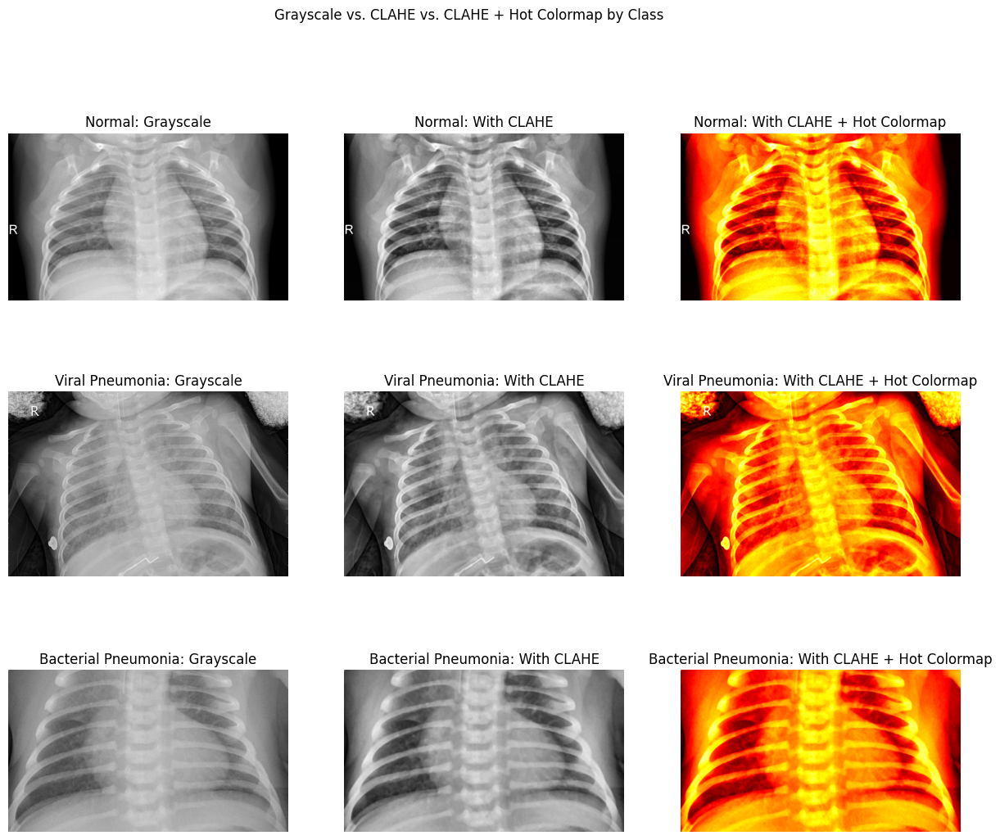

In [ ]:
# Select one random normal image
sample_normal = df_training_set2[df_training_set2['image_class'] == 'normal'].sample(1).iloc[0]

# Select one random bacterial image from pneumonia class
sample_bacterial = df_training_set2[
    (df_training_set2['image_class'] == 'pneumonia') &
    (df_training_set2['image_subclass'] == 'bacterial')
].sample(1).iloc[0]

# Select one random viral image from pneumonia class
sample_viral = df_training_set2[
    (df_training_set2['image_class'] == 'pneumonia') &
    (df_training_set2['image_subclass'] == 'viral')
].sample(1).iloc[0]

samples = [sample_normal, sample_viral, sample_bacterial]
class_names = ['Normal', 'Viral Pneumonia', 'Bacterial Pneumonia']

fig, axs = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle("Grayscale vs. CLAHE vs. CLAHE + Hot Colormap by Class")

for i, sample in enumerate(samples):
    img_path = image_absolute_path_function(sample['orig_file_path'])
    img_pil = Image.open(img_path)
    # Grayscale (EnsureGrayscale)
    img_gray, =  EnsureGrayscale().encodes((img_pil,))
    axs[i, 0].imshow(img_gray, cmap='gray')
    axs[i, 0].set_title(f"{class_names[i]}: Grayscale")
    axs[i, 0].axis('off')


    # CLAHE
    img_clahe, = CLAHETransform().encodes((img_gray,))
    axs[i, 1].imshow(img_clahe, cmap='gray')
    axs[i, 1].set_title(f"{class_names[i]}: With CLAHE")
    axs[i, 1].axis('off')

    # CLAHE + Colormap (Hot)
    img_colormap, = ColormapTransform().encodes((img_clahe,))
    axs[i, 2].imshow(img_colormap)
    axs[i, 2].set_title(f"{class_names[i]}: With CLAHE + Hot Colormap")
    axs[i, 2].axis('off')

plt.tight_layout



The visual comparison shows that CLAHE enhances local contrast, making rib structures and lung tissue boundaries more distinct across all cases. The Hot Colormap transformation provides intuitive heat-map visualization where brighter regions highlight abnormalities—the diffuse infiltrates in viral pneumonia and consolidated regions in bacterial pneumonia, improving feature extraction for deep learning models.

#### Save Training Set 2 Data

Save training set information, so metrics can used without recalculation

In [ ]:
df_training_set2.to_csv(os.path.join(DATA_PATH, 'df_training_set2.csv'),index=False)

---

## Model Preparation and Training


We apply deep learning to classify chest X-ray images as normal, viral pneumonia, or bacterial pneumonia. Rather than building a neural network from scratch, we leverage **transfer learning** using the ResNet-50 architecture, which has been pretrained on the extensive [ImageNet dataset](https://www.image-net.org/). This approach allows us to reuse model image classification capabilities and efficiently fine-tune the model with our x-ray images.

<img src="https://storage.googleapis.com/kaggle-datasets-images/6978/10038/d9e74a548a8cdca167b38520ac8bf405/data-original.png?t=2017-12-13-20-32-53" width="450" alt="ResNet Example">

We train model version of [ResNet-50](https://docs.pytorch.org/vision/main/models/generated/torchvision.models.resnet50.html) to distinguish both general pneumonia and its subtypes using chest X-ray images from the [Kaggle Chest X-Ray Images (Pneumonia) dataset](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia).

Our image sets are prepared with the following enhancements:
- **Grayscale conversion** to standardize input.
- **CLAHE preprocessing** ([method](https://en.wikipedia.org/wiki/Adaptive_histogram_equalization)) is applied to improve local contrast.
- **Hot colormap application** ([details](https://pmc.ncbi.nlm.nih.gov/articles/PMC5148121/)) further enhances feature differentiation, making anatomical and pathological regions more visible.



We will use a two-stage ResNet-50 model pretrained on [ImageNet](https://www.image-net.org/).

- **Stage 1** detects pneumonia vs normal cases.
- **Stage 2** classifies pneumonia cases as viral or bacterial.

Training uses transfer learning, the F1-score metric, and both standard grayscale images and CLAHE-preprocessed images with Hot colormap enhancement for best results.

***Note:This section uses the saved training sets created in the previous section. If your training sets are already prepared, you can start from here after running the setup***


### Training Set 1: Two-Stage Training

Set 1 uses minimally processed grayscale images for hierarchical classification.

####  Load Training Images Data

In [ ]:
## Load cleaned images data
df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))
df_training_set1 = pd.read_csv(os.path.join(DATA_PATH, 'df_training_set1.csv'))

#### Stage 1 Training: Normal vs. Pneumonia

Binary classification optimizing F1-score to prioritize recall and minimize missed cases.

##### Model Training

Create stratified splits for balance, then fine-tune pretrained ResNet-50 with weighted cross-entropy loss.

In [ ]:
df_set1_stage1_train = df_training_set1[df_training_set1['usage_type'] == 'train'].copy()
df_set1_stage1_train = df_set1_stage1_train.reset_index(drop=True)

# split train and validation data proportionally across classes with shuffle
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(df_set1_stage1_train, df_set1_stage1_train['image_class']))

df_set1_stage1_train['is_validation'] = False
df_set1_stage1_train.loc[val_idx, 'is_validation'] = True

dls_set1_stage1 = ImageDataLoaders.from_df(
    df_set1_stage1_train,
    path=PROJECT_PATH,
    fn_col='orig_file_path',
    label_col='image_class',
    valid_col='is_validation',
    item_tfms=[EnsureGrayscale(), Resize(224)],
    batch_tfms=[*aug_transforms(
        do_flip=True, max_rotate=3,
        max_zoom=1,
        max_lighting=0,
        max_warp =0.0,
        p_affine = 0.5
        ),
        Normalize.from_stats(*imagenet_stats)],
    num_workers=num_cores,
    bs=32
)

# Class weights: [normal: 1.5, pneumonia: 1.0] to handle class imbalance
weights = torch.tensor([1.2, 0.8], device=dls_set1_stage1.device)
loss_func = CrossEntropyLossFlat(
     weight=weights
     )

learn_set1_stage1 = vision_learner(
    dls_set1_stage1,
    resnet50,
    pretrained=True,
    loss_func=loss_func,
    metrics=[error_rate, F1Score(average='binary'), Precision(average='binary'), Recall(average='binary')],
    cbs=[
        SaveModelCallback(monitor='f1_score', comp=np.greater, with_opt=True,fname='tmp_set1_stage1_model'),
        EarlyStoppingCallback(monitor='valid_loss', patience=3) #avoid over training
    ]
)

learn_set1_stage1.path = Path(MODEL_PATH)
learn_set1_stage1.model_dir = '.'

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 237MB/s]


Here we train a ResNet-50 model pretrained on ImageNet: first 4 epochs with only the head, then 12 epochs after unfreezing the backbone.

SuggestedLRs(valley=0.0020892962347716093)

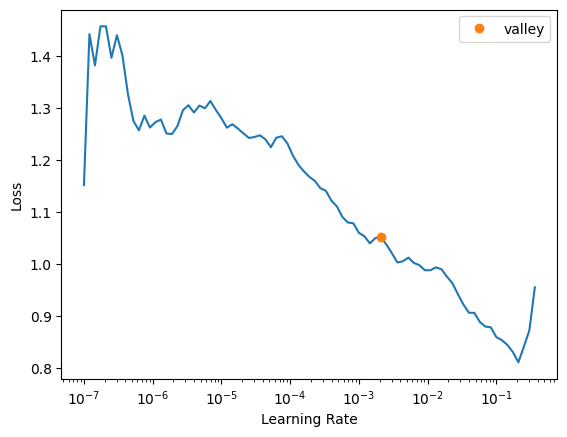

In [ ]:
learn_set1_stage1.lr_find()


In [ ]:
#found using lr_find()
lr = 1e-4

print_learner_config(learn_set1_stage1)

# STAGE 1 - Normal vs Pneumonia
learn_set1_stage1.fit_one_cycle(4,lr)
learn_set1_stage1.unfreeze()
learn_set1_stage1.fit_one_cycle(12,lr)

=== Loss ===
Loss func  : CrossEntropyLossFlat
weight: None (no class weights set)

=== Optimizer & training ===
Weight decay (wd): None

=== Dropout in model head ===
  Dropout p=0.25
  Dropout p=0.5

=== Data & augmentations ===
Batch size : 32
Train batches: 129, Valid batches: 33
Item tfms  :
  - EnsureGrayscale(enc:1,dec:0)
  - Resize -- {'size': (224, 224), 'method': 'crop', 'pad_mode': 'reflection', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0}
(enc:1,dec:0)
  - ToTensor(enc:2,dec:0)
Batch tfms :
  - IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}
(enc:2,dec:1)
  - Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5}
(enc:3,dec:0)
  - Normalize -- {'mean': tensor([[[[0.4850]],

         [[0.4560]],

         [[0.4060]]]], device='cuda:0'), 'std': tensor([[[[0.2290]],

         [[0.2240]],

         [[0.2250]]]], device='cuda:0'), 'axes': (0, 2, 3)}
(enc:2,dec:2)


epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,time
0,0.690636,0.354079,0.121622,0.911017,0.992308,0.842037,04:22
1,0.474417,0.260615,0.082046,0.941581,0.994194,0.894256,01:22
2,0.342469,0.189942,0.058880,0.958923,0.990264,0.929504,01:23
3,0.336181,0.267685,0.083012,0.940853,0.994186,0.892950,01:22


Better model found at epoch 0 with f1_score value: 0.9110169491525424.
Better model found at epoch 1 with f1_score value: 0.9415807560137457.
Better model found at epoch 2 with f1_score value: 0.958922558922559.


epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,time
0,0.303219,0.219888,0.064672,0.954453,0.995745,0.916449,01:23
1,0.234043,0.109432,0.032819,0.977661,0.984127,0.971279,01:33
2,0.188363,0.090884,0.026062,0.982341,0.984273,0.980418,01:30
3,0.137504,0.071434,0.017375,0.988189,0.993404,0.983029,01:31
4,0.098071,0.049191,0.018340,0.987557,0.990802,0.984334,01:31
5,0.110302,0.071989,0.021236,0.985488,0.996000,0.975196,01:24
6,0.067001,0.031345,0.005792,0.996073,0.998688,0.993473,01:25
7,0.049283,0.030986,0.012548,0.991531,0.989597,0.993473,01:31
8,0.069183,0.034793,0.009653,0.993438,0.998681,0.988251,01:26
9,0.034785,0.030037,0.010618,0.992777,0.998679,0.986945,01:26


Better model found at epoch 0 with f1_score value: 0.9544527532290958.
Better model found at epoch 1 with f1_score value: 0.9776609724047306.
Better model found at epoch 2 with f1_score value: 0.9823413996075867.
Better model found at epoch 3 with f1_score value: 0.9881889763779528.
Better model found at epoch 6 with f1_score value: 0.9960732984293194.


The results demonstrated high performance with an F1-score ~ 0.97.

##### Evaluate Training Results

Reload the best model and recompute validation metrics. Final validation: F1 ≈ 0.99.

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_set1_stage1)
results = learn_set1_stage1.validate()
val_loss, val_error, val_f1, val_precision, val_recall = results
print(f"Validation Accuracy: {1 - val_error:.4f}")
print(f"Validation metrics: Loss={val_loss:.4f}, F1={val_f1:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")



Better model found at epoch 0 with f1_score value: 0.9986876640419947.
Validation Accuracy: 0.9942
Validation metrics: Loss=0.0313, F1=0.9961, Precision=0.9987, Recall=0.9935


The final validation results are calculated using the best saved model weights. This approach produced F1 ≈ 0.99, precision ≈ 0.99, and recall ≈ 0.99.

**Confusion Matrix**

Here we show how many images were correctly classified along with the false positives and false negatives in the classification.

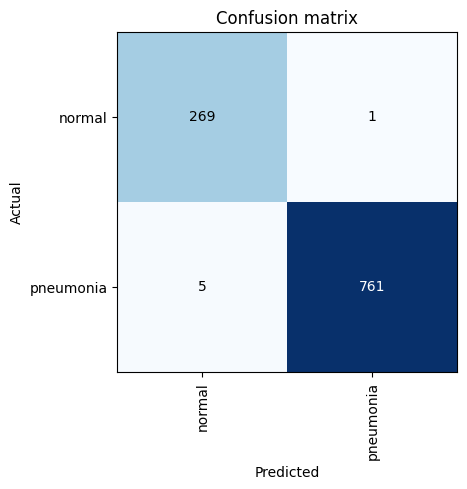

In [ ]:
interp.plot_confusion_matrix()

The confusion matrix shows that only a handful number of images were misclassified during training and validation.

**Top Losses Analysis**

We will show misclassified images along with their predicted probabilities to determine which image types are causing problems.

<Figure size 640x480 with 0 Axes>

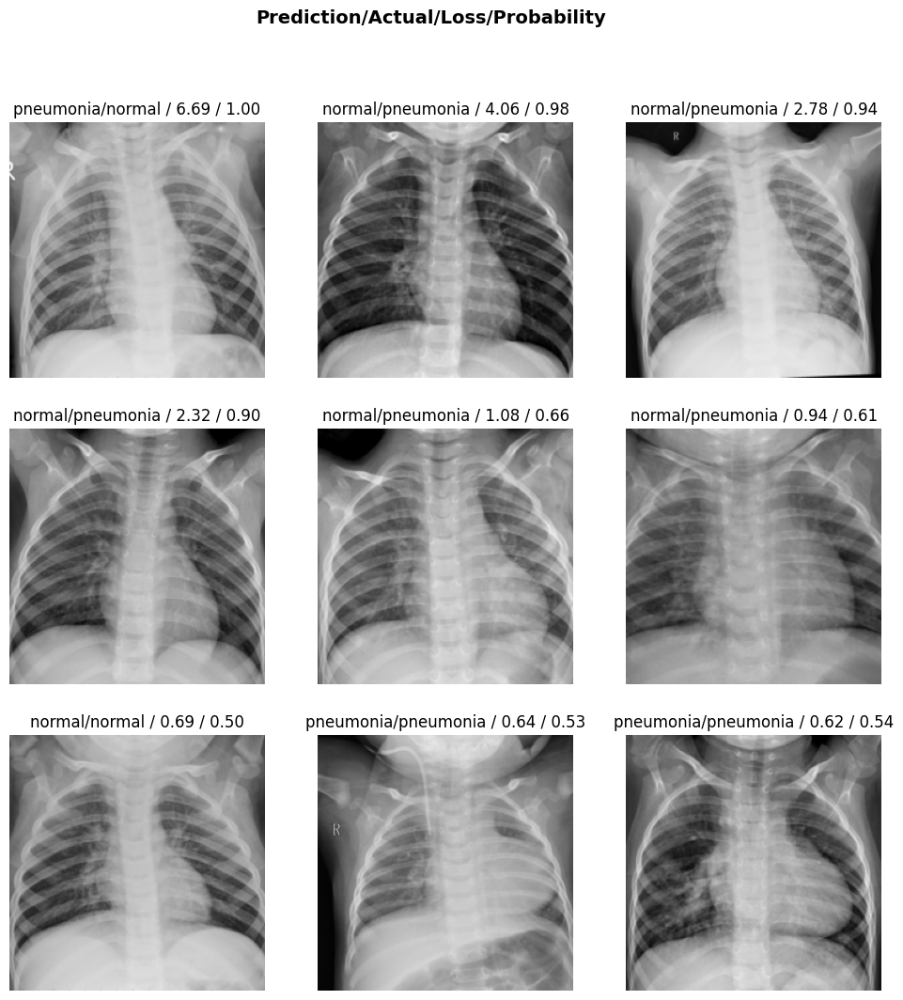

In [ ]:
plt.tight_layout()
interp.plot_top_losses(9, figsize=(12,12))

Some misclassifications occur with high confidence (>0.9).

##### Save Trained Model

After training, we reload the best model checkpoint and export the trained model. Additionally, the backbone weights are saved separately for use in stage 2, allowing transfer learning for pneumonia subtype classification.

In [ ]:
learn_set1_stage1.load('tmp_set1_stage1_model')  # Loads the best checkpoint
# Save model for inference
learn_set1_stage1.export(os.path.join(MODEL_PATH, 'set1_pneumonia_detector.pkl'))

# Save backbone only for stage 2 training
torch.save(
    learn_set1_stage1.model[0].state_dict(),
    Path(MODEL_PATH) / 'set1_pneumonia_detector_backbone.pth'
)

#### Stage 2 Training: Viral vs. Bacterial Pneumonia

Focuses on pneumonia images only, using Stage 1 backbone for subtype classification.

##### Model Training

Here, we use the pretrained pneumonia detection backbone to classify pneumonia cases into bacterial or viral subtypes. Training uses a narrow range of learning rates for this more detailed classification.

In [ ]:
# Filter dataframes for pneumonia images only
df_set1_stage2_train = df_set1_stage1_train[df_set1_stage1_train['image_class']=='pneumonia'].copy()
df_set1_stage2_train = df_set1_stage2_train.reset_index(drop=True)


# split train and validation data proportionally across classes with shuffle
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(df_set1_stage2_train, df_set1_stage2_train['image_subclass']))

df_set1_stage2_train['is_validation'] = False
df_set1_stage2_train.loc[val_idx, 'is_validation'] = True

#prioritize hardest images
focal_loss = FastFocalLoss(alpha=0.25, gamma=2.0)

# DataLoaders for subclassification (bacterial vs viral)
dls_set1_stage2 = ImageDataLoaders.from_df(
    df_set1_stage2_train,
    path=PROJECT_PATH,
    fn_col='orig_file_path',
    label_col='image_subclass',
    valid_col='is_validation',
    item_tfms=[EnsureGrayscale(),Resize(224)],
    loss_func=focal_loss,
    batch_tfms=[*aug_transforms(
        do_flip=True, max_rotate=3,
        max_zoom=1,
        max_lighting=0,
        max_warp =0.0,
        p_affine = 0.5
        ),
        Normalize.from_stats(*imagenet_stats)],
    num_workers=num_cores,
    vocab= image_subclasses,
    bs=64
)

learn_set1_stage2 = vision_learner(
    dls_set1_stage2,
    resnet50,
    pretrained = False,
    metrics=[error_rate, F1Score(average='macro'), Precision(average='macro'), Recall(average='macro')],
    cbs=[
        SaveModelCallback(monitor='f1_score', comp=np.greater, with_opt=True,fname='tmp_set1_stage2_model'),
        EarlyStoppingCallback(monitor='valid_loss', patience=5)
    ]
)

learn_set1_stage2.path = Path(MODEL_PATH)
learn_set1_stage2.model_dir = Path(MODEL_PATH)

# Load the pneumonia trained model
learn_set1_stage2.model[0].load_state_dict(
    torch.load(Path(MODEL_PATH) / 'set1_pneumonia_detector_backbone.pth')
)

<All keys matched successfully>

This block first probes FastAI’s LR finder to grab recommended learning rate, then fine-tunes only the classifier head for six epochs at half that rate to stabilize the new layers. After unfreezing the pretrained backbone, it runs a second 12-epoch fit_one_cycle with a discriminative LR slice (from valley/100 up to valley/10) so low-level filters adapt cautiously while higher layers adjust faster.

SuggestedLRs(valley=0.005248074419796467)

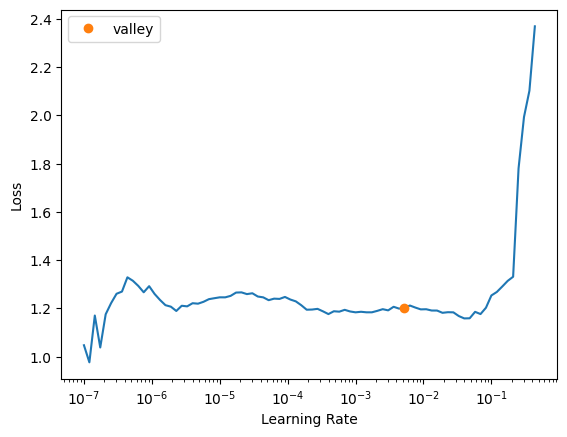

In [ ]:
learn_set1_stage2.lr_find()


In [ ]:
# Train the model
lr = 1e-3
print_learner_config(learn_set1_stage2)

learn_set1_stage2.fit_one_cycle(6, lr_max=lr)  # Fine-tune the head
learn_set1_stage2.unfreeze()
learn_set1_stage2.fit_one_cycle(12, lr_max=slice(lr/100.0, lr/10.0))  # Refine features



=== Loss ===
Loss func  : CrossEntropyLossFlat
weight: None (no class weights set)

=== Optimizer & training ===
Weight decay (wd): None

=== Dropout in model head ===
  Dropout p=0.25
  Dropout p=0.5

=== Data & augmentations ===
Batch size : 32
Train batches: 95, Valid batches: 24
Item tfms  :
  - EnsureGrayscale(enc:1,dec:0)
  - Resize -- {'size': (224, 224), 'method': 'crop', 'pad_mode': 'reflection', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0}
(enc:1,dec:0)
  - ToTensor(enc:2,dec:0)
Batch tfms :
  - IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}
(enc:2,dec:1)
  - Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5}
(enc:3,dec:0)
  - Normalize -- {'mean': tensor([[[[0.4850]],

         [[0.4560]],

         [[0.4060]]]], device='cuda:0'), 'std': tensor([[[[0.2290]],

         [[0.2240]],

         [[0.2250]]]], device='cuda:0'), 'axes': (0, 2, 3)}
(enc:2,dec:2)


epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,time
0,0.655697,1.164892,0.418514,0.581347,0.633498,0.636631,00:50
1,0.709571,0.853862,0.344198,0.399658,0.827676,0.501887,00:56
2,0.694594,0.724748,0.332464,0.519226,0.622258,0.548264,00:50
3,0.660328,0.604174,0.338983,0.438254,0.646672,0.515669,00:49
4,0.612313,0.558133,0.262060,0.681020,0.717647,0.671529,00:50
5,0.591382,0.540540,0.256845,0.683053,0.728486,0.672841,00:57


Better model found at epoch 0 with f1_score value: 0.5813468277976443.
Better model found at epoch 4 with f1_score value: 0.6810203739605597.
Better model found at epoch 5 with f1_score value: 0.6830531974920973.


epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,time
0,0.591092,0.543226,0.256845,0.686525,0.725610,0.676404,00:56
1,0.593064,0.535158,0.255541,0.687693,0.727794,0.677400,00:56
2,0.579436,0.531110,0.249022,0.703839,0.730552,0.693960,00:56
3,0.565980,0.535060,0.250326,0.706902,0.726209,0.698309,00:56
4,0.563080,0.523903,0.245111,0.705915,0.737665,0.695167,00:55
5,0.552208,0.528024,0.249022,0.706000,0.729195,0.696632,00:49
6,0.566164,0.515673,0.237288,0.713081,0.750374,0.701143,00:50
7,0.567035,0.525324,0.246415,0.710464,0.731716,0.701297,00:56
8,0.555821,0.520805,0.242503,0.710512,0.739962,0.699831,00:49
9,0.547334,0.519975,0.249022,0.703839,0.730552,0.693960,00:49


Better model found at epoch 0 with f1_score value: 0.6865250522288817.
Better model found at epoch 1 with f1_score value: 0.6876932025926541.
Better model found at epoch 2 with f1_score value: 0.703838852690674.
Better model found at epoch 3 with f1_score value: 0.7069023166945307.
Better model found at epoch 6 with f1_score value: 0.713081261510129.
No improvement since epoch 6: early stopping


The bacterial vs. viral pneumonia classifier, trained with balanced class weights and F1-score monitoring, achieved moderate performance, with best validation F1-score reaching ~0.76 and recall up to ~0.76 during training.

##### Evaluate Training Results

After training, we reload the best saved model and recalculate metrics on the validation set for an accurate assessment.

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_set1_stage2)
results = learn_set1_stage2.validate()
val_loss, val_error, val_f1, val_precision, val_recall = results
print(f"Validation Accuracy: {1 - val_error:.4f}")
print(f"Validation metrics: Loss={val_loss:.4f}, F1={val_f1:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")

Better model found at epoch 0 with f1_score value: 0.7503742795119395.
Validation Accuracy: 0.7627
Validation metrics: Loss=0.5157, F1=0.7131, Precision=0.7504, Recall=0.7011


The final validation results are calculated using the best saved model weights for subtype classification. This approach produced an F1-score of approximately 0.76, with precision and recall ≈ 0.76, confirming moderate—performance for bacterial vs. viral pneumonia detection.

**Confusion Matrix**

Here we show how many images were correctly classified along with the false positives and false negatives for viral and bacterial pneumonia.

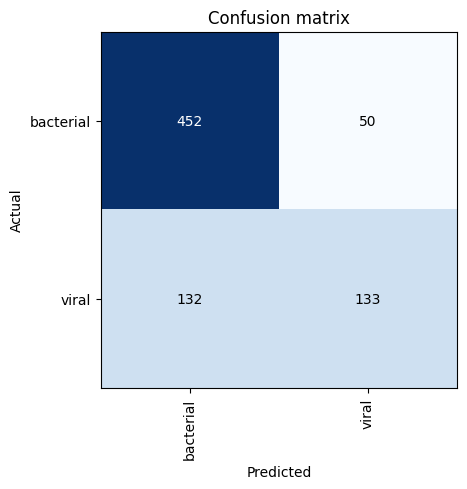

In [ ]:
interp.plot_confusion_matrix()

The model more reliably detects bacterial pneumonia (percentage wise), but confuses 76 viral cases as bacterial and 90 bacterial cases as viral.

**Top Losses Analysis**

We will show misclassified viral and bacterial pneumonia images along with their predicted probabilities to determine which image types are causing problems.

<Figure size 640x480 with 0 Axes>

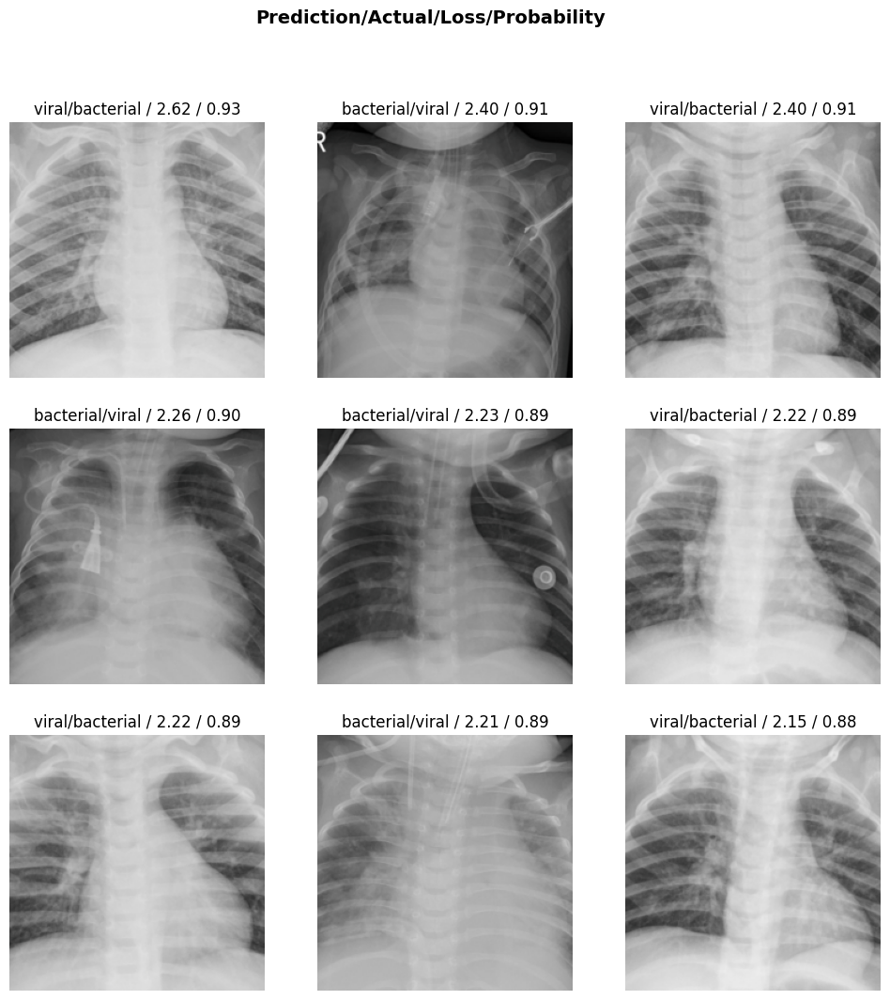

In [ ]:
plt.tight_layout()
interp.plot_top_losses(9, figsize=(12,12))

Several concerning examples were misclassified with high confidence (probabilities above 0.9). These errors are most common in zoomed-in, low-contrast images.

##### Save Trained Model

We will save trained model for deployment.

In [ ]:
learn_set1_stage2.load('tmp_set1_stage2_model')  # Loads the best checkpoint
# Save Stage 2 model for iference
learn_set1_stage2.export(os.path.join(MODEL_PATH, 'set1_stage2_bacterial_viral_detector.pkl'))

### Training Set 2 - Two-Stage Classification with CLAHE and Colormap Enhancements

In Training Set 2, we enhanced chest X-ray images using Contrast Limited Adaptive Histogram Equalization (CLAHE). This set will use the same hierarchical two-stage classification pipeline as Set 1.

####  Load training images data

In [ ]:
df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))
df_training_set2 = pd.read_csv(os.path.join(DATA_PATH, 'df_training_set2.csv'))
df_set2_stage1_train = df_training_set2[df_training_set2['usage_type']=='train'].copy()
df_set2_stage1_train = df_set2_stage1_train.reset_index(drop=True)

#### Stage 1 Training - Normal vs Pneumonia

For the first-stage model using Training Set 2, we prioritize recall to avoid missing pneumonia cases, as pneumonia images are more common in the dataset.




##### Model training

In [ ]:

# Stratified split for validation
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(df_set2_stage1_train, df_set2_stage1_train['image_class']))

df_set2_stage1_train['is_validation'] = False
df_set2_stage1_train.loc[val_idx, 'is_validation'] = True

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock(vocab=image_classes)),
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader('image_class'),
    splitter=ColSplitter('is_validation'),
    item_tfms=[EnsureGrayscale(), CLAHETransform(), ColormapTransform(), Resize(224, method=ResizeMethod.Pad, pad_mode=PadMode.Zeros)],
      batch_tfms=[*aug_transforms(
        do_flip=False,
        max_rotate=0.0,
        max_zoom=1.05,
        max_lighting=0.00,
        p_lighting=0.75,
        max_warp=0.0,
        pad_mode=PadMode.Zeros,
        p_affine=0.75
    ),
    Normalize()]
)

dls_set2_stage1 = dblock.dataloaders(
    df_set2_stage1_train,
    bs=64,
    num_workers=num_cores,
    path=PROJECT_PATH
)


weights = torch.tensor([1.0, 0.5], device=dls_set2_stage1.device)
loss_func = CrossEntropyLossFlat(
    weight=weights
)

loss_function = LabelSmoothingCrossEntropyFlat(eps=0.20)

learn_set2_stage1 = vision_learner(
    dls_set2_stage1,
    resnet50,
    pretrained=True,
    loss_func=loss_function,
    metrics=[
      error_rate,
      F1Score(average='binary'),
      Precision(average='binary'),
      Recall(average='binary'),
      RocAucBinary()
    ],
    wd=0.0005,
   # ps=0.45,
    cbs=[
        SaveModelCallback(monitor='f1_score', comp=np.greater, with_opt=True,fname='tmp_set2_stage1_model'),
        EarlyStoppingCallback(monitor='valid_loss', patience=3)
    ]
)

learn_set2_stage1.model_dir = MODEL_PATH



SuggestedLRs(valley=0.0005754399462603033)

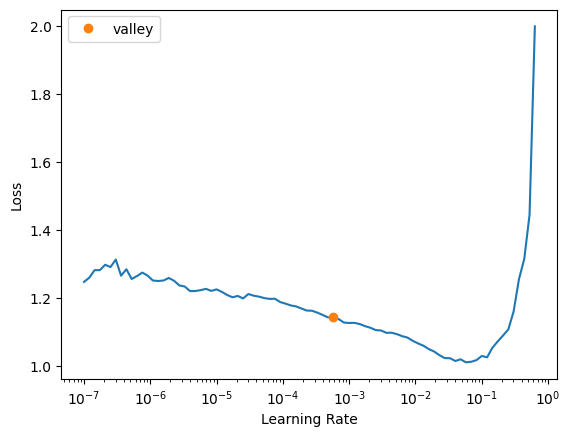

In [ ]:
learn_set2_stage1.lr_find()

Here we will train ResNet-50 model with CLAHE + Colormap (Hot) adjusted images

In [ ]:
  # Based on Learning Rate Finder
lr = 5e-4

print_learner_config(learn_set2_stage1)

# STAGE 1 - Normal vs Pneumonia
learn_set2_stage1.fit_one_cycle(4,lr)
learn_set2_stage1.unfreeze()
learn_set2_stage1.fit_one_cycle(8,lr)

=== Loss ===
Loss func  : LabelSmoothingCrossEntropyFlat
  (generic loss; params from __dict__)
    __stored_args__: {'eps': 0.2, 'weight': None, 'reduction': 'mean'}
    axis: -1
    flatten: True
    floatify: False
    is_2d: True
    func: LabelSmoothingCrossEntropy()
    __module__: fastai.losses
    __doc__: None
    __annotations__: {'dump_patches': <class 'bool'>, '_version': <class 'int'>, 'training': <class 'bool'>, '_parameters': dict[str, typing.Optional[torch.nn.parameter.Parameter]], '_buffers': dict[str, typing.Optional[torch.Tensor]], '_non_persistent_buffers_set': set[str], '_backward_pre_hooks': dict[int, typing.Callable], '_backward_hooks': dict[int, typing.Callable], '_is_full_backward_hook': typing.Optional[bool], '_forward_hooks': dict[int, typing.Callable], '_forward_hooks_with_kwargs': dict[int, bool], '_forward_hooks_always_called': dict[int, bool], '_forward_pre_hooks': dict[int, typing.Callable], '_forward_pre_hooks_with_kwargs': dict[int, bool], '_state_dict

epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,roc_auc_score,time
0,0.911067,0.579534,0.121622,0.913462,0.963768,0.868146,0.957277,02:30
1,0.745605,0.504336,0.087838,0.939212,0.961696,0.917755,0.968383,02:33
2,0.636679,0.457414,0.061776,0.958115,0.960630,0.955614,0.977164,02:29
3,0.589738,0.454460,0.066602,0.954990,0.954368,0.955614,0.977526,02:31


Better model found at epoch 0 with f1_score value: 0.9134615384615384.
Better model found at epoch 1 with f1_score value: 0.9392117568470274.
Better model found at epoch 2 with f1_score value: 0.9581151832460733.


epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,roc_auc_score,time
0,0.553625,0.440385,0.065637,0.955381,0.960422,0.950392,0.981254,02:30
1,0.511845,0.448358,0.039575,0.973185,0.975098,0.971279,0.990441,02:41
2,0.457616,0.389396,0.037645,0.974121,0.990553,0.958225,0.994454,02:36
3,0.424326,0.393208,0.032819,0.977454,0.993261,0.962141,0.996509,02:38
4,0.399695,0.364833,0.023166,0.984536,0.972010,0.997389,0.996055,02:35
5,0.383144,0.356348,0.018340,0.987574,0.989515,0.985640,0.998554,02:37
6,0.373729,0.363287,0.020270,0.986230,0.990777,0.981723,0.998632,02:37
7,0.370799,0.359367,0.019305,0.986859,0.993386,0.980418,0.998506,02:30


Better model found at epoch 0 with f1_score value: 0.9553805774278216.
Better model found at epoch 1 with f1_score value: 0.973185088293002.
Better model found at epoch 2 with f1_score value: 0.9741207697412076.
Better model found at epoch 3 with f1_score value: 0.9774535809018567.
Better model found at epoch 4 with f1_score value: 0.9845360824742269.
Better model found at epoch 5 with f1_score value: 0.9875735775016351.


On training data we reached ~0.99 `F1_Score`, and ~0.08 `error_rate`.

##### Evaluate Training Results

After training, we reload the best saved model and recalculate metrics on the validation set for an accurate assessment. We then use the confusion matrix to examine how many images are misclassified.

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_set2_stage1)
results = learn_set2_stage1.validate()
val_loss, val_error, val_f1, val_precision, val_recall,roc_acc = results
print(f"Validation Accuracy: {1 - val_error:.4f}")
print(f"Validation metrics: Loss={val_loss:.4f}, F1={val_f1:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")


Better model found at epoch 0 with f1_score value: 0.9895150720838795.
Validation Accuracy: 0.9817
Validation metrics: Loss=0.3563, F1=0.9876, Precision=0.9895, Recall=0.9856


Validation of the model reconfirms its strong results, with an F1-score, precision, and recall ~ 0.99.

**Confusion Matrix**

In [ ]:
interp.plot_confusion_matrix()

Only 5 pneumonia case misclassified as normal (false-negative) and 3 normal cases misclassified as pneumonia.

**Top Losses Analysis**

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Figure size 640x480 with 0 Axes>

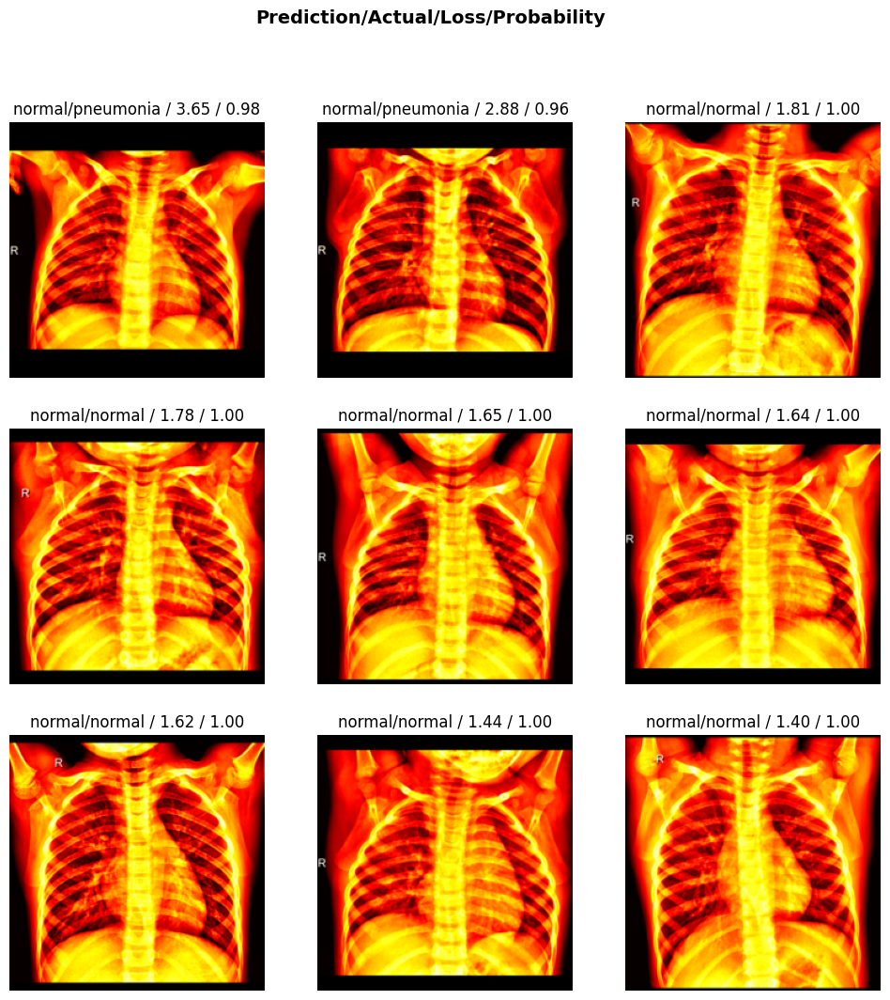

In [ ]:
plt.tight_layout()
interp.plot_top_losses(9, figsize=(12,12))

The model tends to be confident in some misclassifications, but with lower loss than training set 1.

##### Save Trained Model

After training, we reload the best model checkpoint and export the trained model. Additionally, the backbone weights are saved separately for use in stage 2, allowing transfer learning for pneumonia subtype classification.

In [ ]:
learn_set2_stage1.load('tmp_set2_stage1_model')  # Loads the best checkpoint
# Save Stage 1 weights
learn_set2_stage1.export(os.path.join(MODEL_PATH, 'set2_pneumonia_detector.pkl'))

# Save backbone for stage 2 training
torch.save(
    learn_set2_stage1.model[0].state_dict(),
    Path(MODEL_PATH) / 'set2_pneumonia_detector_backbone.pth'
)

#### Stage 2 Training - Pneumonia Viral vs Pneumonia Bacterial

For stage 2, the model focuses on distinguishing bacterial vs. viral pneumonia among images already identified as pneumonia in stage 1. We leverage the trained backbone from stage 1. To address the substantial class imbalance between bacterial and viral images, we apply class weights in the loss function. We also use our dataset statistics for training normalization and apply minimal augumentation.

##### Model Training

In [ ]:
# Filter dataframes for pneumonia images only
df_set2_stage2_train = df_set2_stage1_train[df_set2_stage1_train['image_class']=='pneumonia'].copy()
df_set2_stage2_train = df_set2_stage2_train.reset_index(drop=True)

# split train and validation data proportionally across subclasses with shuffle
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(df_set2_stage2_train, df_set2_stage2_train['image_subclass']))

df_set2_stage2_train['is_validation'] = False
df_set2_stage2_train.loc[val_idx, 'is_validation'] = True

#prioritize hardest images
focal_loss = FastFocalLoss(0.25, gamma=2.0)

# DataLoaders for subclassification (bacterial vs viral)
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock(vocab=image_subclasses)),
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader('image_subclass'),
    splitter=ColSplitter('is_validation'),
    item_tfms=[EnsureGrayscale(), CLAHETransform(), ColormapTransform(), Resize(224,method='pad',pad_mode='zeros')],
      batch_tfms=[*aug_transforms(
        do_flip=False,
        max_rotate=0,
        max_zoom=1.05,
        max_lighting=0.0,
        p_lighting=0.75,
        max_warp=0.0,
        pad_mode='zeros'
    ),
    Normalize.from_stats(*imagenet_stats)],

)

dls_set2_stage2 = dblock.dataloaders(
    df_set2_stage2_train,
    bs=64,
    drop_last=False,
    num_workers=num_cores,
    path=PROJECT_PATH
)

learn_set2_stage2 = vision_learner(
    dls_set2_stage2,
    resnet50,
    wd = 0.1,
    ps = 0.40,
    loss_func=focal_loss,
    pretrained=False,
    metrics=[error_rate, F1Score(average='macro'), Precision(average='macro'), Recall(average='macro')],
    cbs=[
        GradientAccumulation(n_acc=2),
        SaveModelCallback(monitor='f1_score', comp=np.greater, with_opt=True,fname='tmp_set2_stage2_model'),
        EarlyStoppingCallback(monitor='valid_loss', patience=5)
    ]
)

# Load the pneumonia trained model
learn_set2_stage2.model[0].load_state_dict(
    torch.load(Path(MODEL_PATH) / 'set2_pneumonia_detector_backbone.pth')
)

learn_set2_stage2.path = Path(MODEL_PATH)
learn_set2_stage2.model_dir = '.'

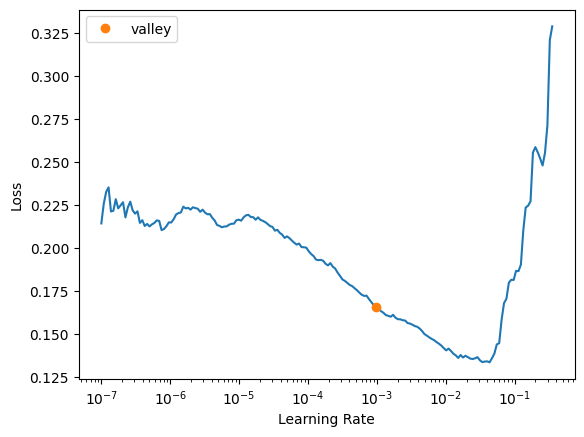

In [ ]:
suggestion = learn_set2_stage2.lr_find(
    start_lr=1e-7,        # Start very low for focal loss
    end_lr=1,             # End lower than default (10) - your focal loss is sensitive
    num_it=200,           # Double default for smoother curve
    show_plot=True
)




Here, we use the pretrained pneumonia detection backbone to classify pneumonia cases into bacterial or viral subtypes. Training uses a narrow range of learning rates for this more detailed classification.

In [ ]:
#Bacterial vs Viral Training
lr = 1e-3
print("Learning rate  ",lr)

print_learner_config(learn_set2_stage2)

learn_set2_stage2.fit_one_cycle(6, lr_max=lr/2)
learn_set2_stage2.unfreeze()
learn_set2_stage2.fit_one_cycle(12, lr_max=slice(lr/10, lr/100))

Learning rate   0.001
=== Loss ===
Loss func  : FastFocalLoss
  alpha          : 0.25
  gammma         : 2.0

=== Optimizer & training ===
Weight decay (wd): 0.1

=== Dropout in model head ===
  Dropout p=0.2
  Dropout p=0.4

=== Data & augmentations ===
Batch size : 64
Train batches: 48, Valid batches: 12
Item tfms  :
  - EnsureGrayscale()
  - CLAHETransform(clip_limit=2.0, tile_grid_size=(8, 8), medianBlur=7, p=1.0)
  - ColormapTransform(colormap='HOT', p=1.0)
  - Resize -- {'size': (224, 224), 'method': 'pad', 'pad_mode': 'zeros', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0}
(enc:1,dec:0)
  - ToTensor(enc:2,dec:0)
Batch tfms :
  - IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}
(enc:2,dec:1)
  - Zoom -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'zeros', 'mode_mask': 'nearest', 'align_corners': True, 'p': 1.0}
(enc:3,dec:0)
  - Normalize -- {'mean': tensor([[[[0.4850]],

         [[0.4560]],

         [[0.4060]]]], device='cuda:0'), 'std': tensor

epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,time
0,0.161190,0.151022,0.366362,0.616531,0.617626,0.628370,01:23
1,0.127422,0.079463,0.277705,0.614193,0.743092,0.617710,01:29
2,0.104000,0.073273,0.262060,0.704505,0.709455,0.700925,01:22
3,0.083110,0.054192,0.247718,0.731157,0.727831,0.735932,01:28
4,0.067324,0.054764,0.230769,0.746429,0.745024,0.747989,01:30
5,0.056826,0.052176,0.233377,0.737877,0.742281,0.734417,01:29


Better model found at epoch 0 with f1_score value: 0.6165307048368014.
Better model found at epoch 2 with f1_score value: 0.7045052470171067.
Better model found at epoch 3 with f1_score value: 0.7311572065291183.
Better model found at epoch 4 with f1_score value: 0.7464292318295669.


epoch,train_loss,valid_loss,error_rate,f1_score,precision_score,recall_score,time
0,0.052845,0.052762,0.230769,0.737680,0.746234,0.731955,01:22
1,0.051599,0.057725,0.237288,0.736718,0.737605,0.735883,01:31
2,0.052325,0.065895,0.225554,0.740895,0.753803,0.733267,01:22
3,0.048154,0.046133,0.233377,0.737877,0.742281,0.734417,01:30
4,0.049408,0.060816,0.246415,0.723767,0.727354,0.720894,01:25
5,0.044282,0.058439,0.232073,0.743884,0.743461,0.744321,01:24
6,0.041042,0.078723,0.242503,0.735541,0.732836,0.739025,01:31
7,0.036540,0.057805,0.228162,0.744717,0.748024,0.741964,01:26
8,0.033101,0.055596,0.234681,0.739135,0.740511,0.737875,01:32


Better model found at epoch 0 with f1_score value: 0.7376804957365037.
Better model found at epoch 2 with f1_score value: 0.7408950758914536.
Better model found at epoch 5 with f1_score value: 0.743884411627872.
Better model found at epoch 7 with f1_score value: 0.744716987232521.
No improvement since epoch 3: early stopping


The bacterial vs. viral classifier stalled at F1-score ~ 0.74, with error rate below 0.23, indicating balanced and moderately strong discrimination between the two pneumonia subtypes. For bacterial vs viral classifier with CLAHE, we can see slightly better detection than without it.

##### Evaluate Training Results

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_set2_stage2)
results = learn_set2_stage2.validate()
val_loss, val_error, val_f1, val_precision, val_recall = results
print(f"Validation Accuracy: {1 - val_error:.4f}")
print(f"Validation metrics: Loss={val_loss:.4f}, F1={val_f1:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")

Better model found at epoch 0 with f1_score value: 0.7480235783633842.
Validation Accuracy: 0.7718
Validation metrics: Loss=0.0578, F1=0.7447, Precision=0.7480, Recall=0.7420


Validation reconfirms strong training results with `F1-score` reaching 75%.

**Confusion Matrix**

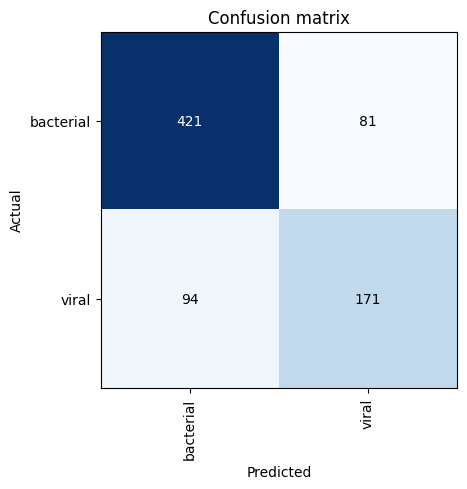

In [ ]:
interp.plot_confusion_matrix()

With CLAHE preprocessing, the model is better at identifying both bacterial and viral pneumonia. The number of correctly classified viral cases increased compared to no CLAHE.

**Top Losses Analysis**

<Figure size 640x480 with 0 Axes>

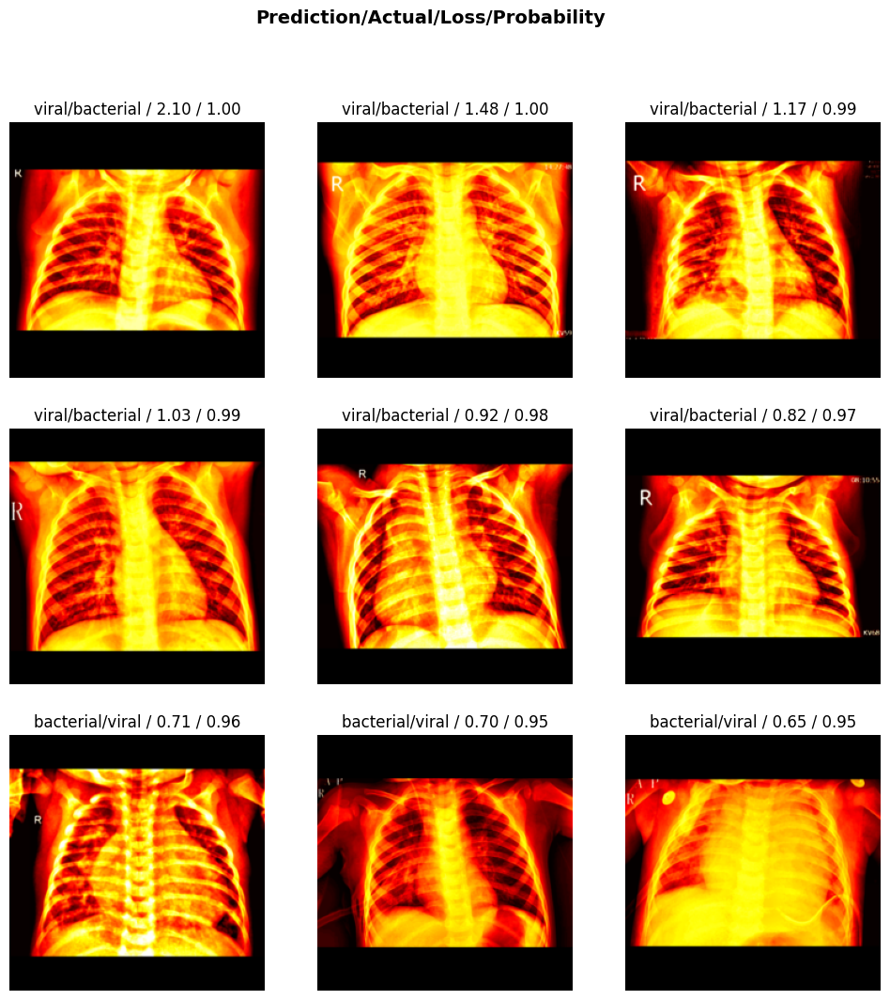

In [ ]:
plt.tight_layout()
interp.plot_top_losses(9, figsize=(12,12))

We can observe that several images are incorrectly classified with strong confidence, which means that CLAHE preprocessing negatively impacts certain images.

##### Save Trained Model

We will save trained model, so we can test it with other images.

In [ ]:
learn_set2_stage2.load('tmp_set2_stage2_model')  # Loads the best checkpoint
# Save Stage 2 weights
learn_set2_stage2.export(os.path.join(MODEL_PATH, 'set2_stage2_bacterial_viral_detector.pkl'))

---

## Test  Models on the Testing Sets

### Load Training Sets data

In [ ]:
df_training_set1 = pd.read_csv(os.path.join(DATA_PATH, 'df_training_set1.csv'))
df_training_set2 = pd.read_csv(os.path.join(DATA_PATH, 'df_training_set2.csv'))

### Model 1 Testing


#### Test Pneumonia vs Normal Model




In [ ]:
df_test1_stage1 = df_training_set1[
    (df_training_set1['usage_type'] == 'test')].copy()

# Load trained bacterial/viral model
learn_set1_stage1 = load_learner(os.path.join(MODEL_PATH, 'set1_pneumonia_detector.pkl'))

test_dl_set1_stage1 = learn_set1_stage1.dls.test_dl(df_test1_stage1)

all_preds, _ = learn_set1_stage1.get_preds(dl=test_dl_set1_stage1)

pred_labels = [learn_set1_stage1.dls.vocab[i] for i in all_preds.argmax(dim=1)]
max_confidence = all_preds.max(dim=1).values.cpu().numpy()
labels_set1_stage1_test = df_test1_stage1['image_class'].tolist()


# Build results DataFrame
df_test1_stage1_results = df_test1_stage1.copy()
df_test1_stage1_results['predicted_class'] = pred_labels
df_test1_stage1_results['true_class'] = labels_set1_stage1_test
df_test1_stage1_results['confidence'] = max_confidence
df_test1_stage1_results['correct'] = (df_test1_stage1_results['predicted_class'] == df_test1_stage1_results['true_class']).astype(int)

# Save results
df_test1_stage1_results.to_csv(DATA_PATH+"/results_set1_stage1_test.csv", index=False)



/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


**Testing Results Analysis**

In [ ]:

actual_classes = df_test1_stage1_results['true_class']
predicted_classes = df_test1_stage1_results['predicted_class']
labels = ['normal','pneumonia']

accuracy = accuracy_score(actual_classes, predicted_classes)
precision = precision_score(actual_classes, predicted_classes, average='binary', pos_label='pneumonia')
recall = recall_score(actual_classes, predicted_classes, average='binary', pos_label='pneumonia')
f1 = f1_score(actual_classes, predicted_classes, average='binary', pos_label='pneumonia')

print(f"Accuracy: {accuracy:.3f}")
print(f"Binary Precision: {precision:.3f}")
print(f"Binary Recall: {recall:.3f}")
print(f"Binary F1-score: {f1:.3f}")

Accuracy: 0.806
Binary Precision: 0.767
Binary Recall: 0.990
Binary F1-score: 0.865


**Confusion Matrix**

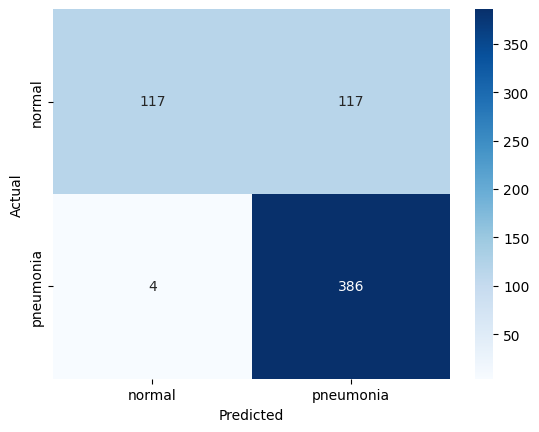

In [ ]:
labels = image_classes

cm = confusion_matrix(actual_classes, predicted_classes, labels=df_test1_stage1_results['true_class'].unique())
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=df_test1_stage1_results['true_class'].unique(),
            yticklabels=df_test1_stage1_results['true_class'].unique())
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

50% of normal x-rays were misclassified as pneumonia showing strong over confidence on pneumonia. In case of pneumonia cases, around 99% were correctly classified.

##### Evaluate Normal and Pneumonia Testing Results

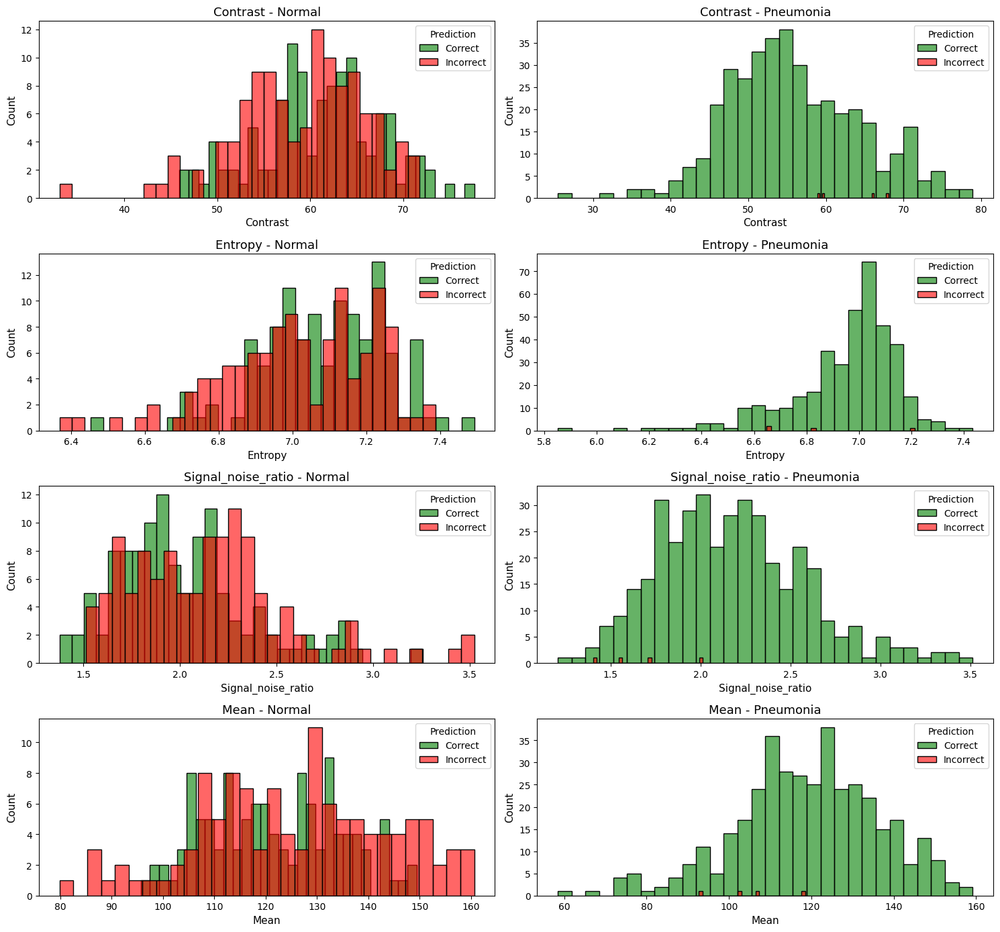

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

group_names = {1: 'Correct', 0: 'Incorrect'}
group_colors = {1: 'green', 0: 'red'}

fig, axes = plt.subplots(len(metrics), len(image_classes), figsize=(15, 14), sharex=False)

for i, metric in enumerate(metrics):
    for j, cls in enumerate(image_classes):
        ax = axes[i, j]
        for corr in [1, 0]:  # correct, incorrect
            vals = df_test1_stage1_results[
                (df_test1_stage1_results['image_class'] == cls) &
                (df_test1_stage1_results['correct'] == corr)
            ][metric].dropna()
            sns.histplot(
                vals,
                bins=30,
                ax=ax,
                color=group_colors[corr],
                alpha=0.6,
                linewidth=1,
                label=group_names[corr]
            )
        ax.set_title(f"{metric.capitalize()} - {cls.capitalize()}", fontsize=13)
        ax.set_xlabel(metric.capitalize(), fontsize=11)
        ax.set_ylabel('Count', fontsize=11)
        ax.legend(title='Prediction')

plt.tight_layout()
plt.show()

#### Test Viral vs Bacterial Model

In [ ]:
from fastai.vision.all import *
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

df_test1_stage2 = df_training_set1[
    (df_training_set1['usage_type'] == 'test') &
    (df_training_set1['image_class'] == 'pneumonia')
].copy()

# Load trained bacterial/viral model
learn_set1_stage2 = load_learner(os.path.join(MODEL_PATH, 'set1_stage2_bacterial_viral_detector.pkl'))

test_dl_set1_stage2 = learn_set1_stage2.dls.test_dl(df_test1_stage2)

all_preds, _ = learn_set1_stage2.get_preds(dl=test_dl_set1_stage2)

pred_labels = [learn_set1_stage2.dls.vocab[i] for i in all_preds.argmax(dim=1)]
max_confidence = all_preds.max(dim=1).values.cpu().numpy()
labels_set1_stage2_test = df_test1_stage2['image_subclass'].tolist()  # bacterial/viral

# Build results DataFrame
df_test1_stage2_results = df_test1_stage2.copy()
df_test1_stage2_results['predicted_class'] = pred_labels
df_test1_stage2_results['true_class'] = labels_set1_stage2_test
df_test1_stage2_results['confidence'] = max_confidence
df_test1_stage2_results['correct'] = (df_test1_stage2_results['predicted_class'] == df_test1_stage2_results['true_class']).astype(int)

# Save results
df_test1_stage2_results.to_csv(DATA_PATH+"/results_set1_stage2_test.csv", index=False)



/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


**Testing Results Analysis**

In [ ]:
actual_classes = df_test1_stage2_results['true_class']
predicted_classes = df_test1_stage2_results['predicted_class']
labels = sorted(list(set(actual_classes) | set(predicted_classes)))  # ensures all unique labels are used

accuracy = accuracy_score(actual_classes, predicted_classes)
precision = precision_score(actual_classes, predicted_classes, average='macro', labels=labels)
recall = recall_score(actual_classes, predicted_classes, average='macro', labels=labels)
f1 = f1_score(actual_classes, predicted_classes, average='macro', labels=labels)

print(f"Accuracy: {accuracy:.3f}")
print(f"Macro Precision: {precision:.3f}")
print(f"Macro Recall: {recall:.3f}")
print(f"Macro F1-score: {f1:.3f}")

Accuracy: 0.897
Macro Precision: 0.926
Macro Recall: 0.866
Macro F1-score: 0.884


**Confusion Matrix**

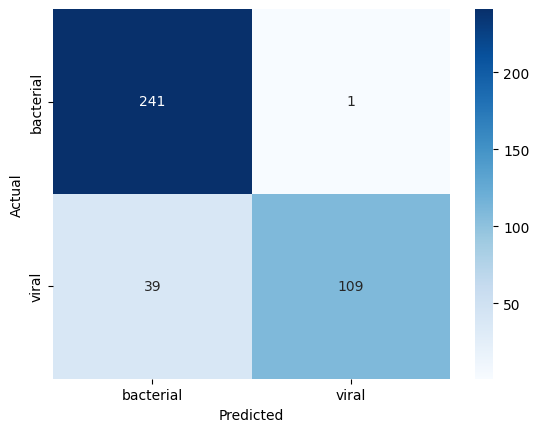

In [ ]:

# Get all present labels
labels = image_classes

cm = confusion_matrix(actual_classes, predicted_classes, labels=df_test1_stage2_results['true_class'].unique())
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=df_test1_stage2_results['true_class'].unique(),
            yticklabels=df_test1_stage2_results['true_class'].unique())
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()





##### Evaluate Viral and Bacterial Test Results

We will evaluate misclassified image characteristics to identify trends

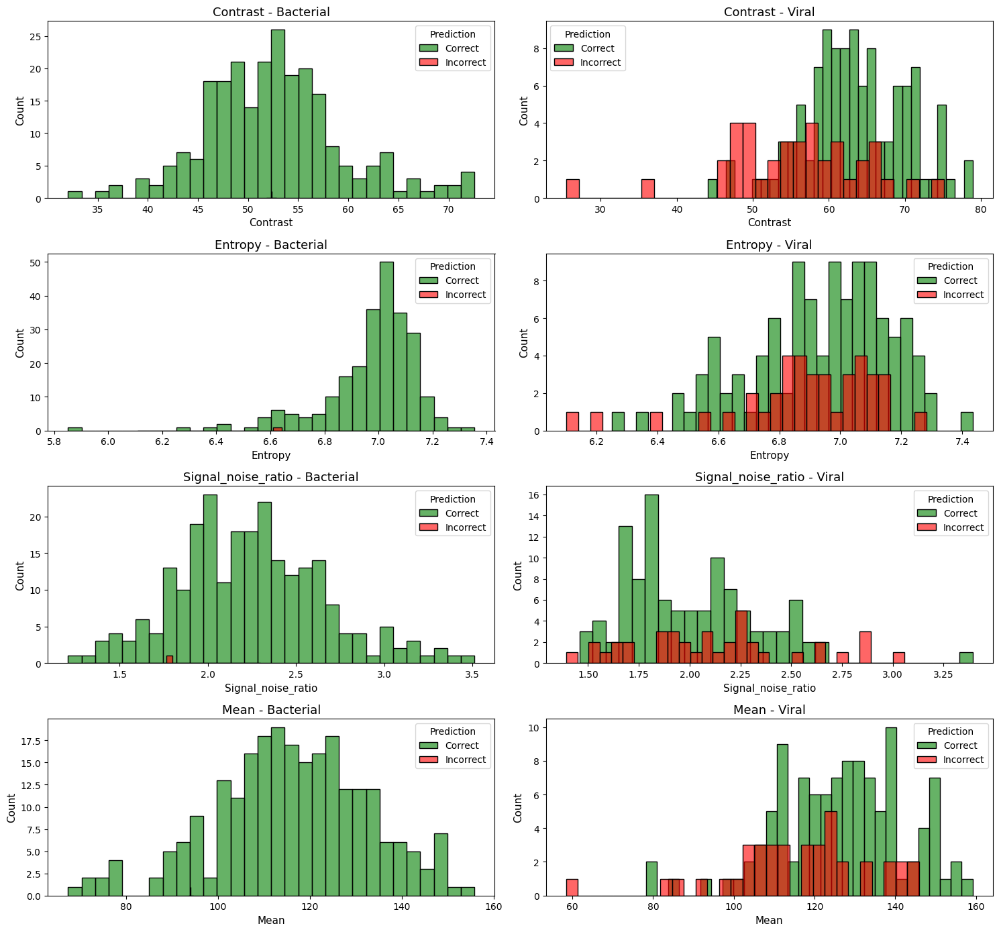

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

group_names = {1: 'Correct', 0: 'Incorrect'}
group_colors = {1: 'green', 0: 'red'}

fig, axes = plt.subplots(len(metrics), len(image_classes), figsize=(15, 14), sharex=False)

for i, metric in enumerate(metrics):
    for j, cls in enumerate(image_subclasses):
        ax = axes[i, j]
        for corr in [1, 0]:  # correct, incorrect
            vals = df_test1_stage2_results[
                (df_test1_stage2_results['image_subclass'] == cls) &
                (df_test1_stage2_results['correct'] == corr)
            ][metric].dropna()
            sns.histplot(
                vals,
                bins=30,
                ax=ax,
                color=group_colors[corr],
                alpha=0.6,
                linewidth=1,
                label=group_names[corr]
            )
        ax.set_title(f"{metric.capitalize()} - {cls.capitalize()}", fontsize=13)
        ax.set_xlabel(metric.capitalize(), fontsize=11)
        ax.set_ylabel('Count', fontsize=11)
        ax.legend(title='Prediction')

plt.tight_layout()
plt.show()

### Model 2 Testing


#### Test Pneumonia vs Normal Model

In [ ]:
# Define the test set using df_training_set2
df_test_set2_stage1 = df_training_set2[df_training_set2['usage_type'] == 'test'].copy()

# Load the previously saved stage 1 model
learn_set2_stage1 = load_learner(os.path.join(MODEL_PATH, 'set2_pneumonia_detector.pkl'))

# Create test dataloader
test_dl = learn_set2_stage1.dls.test_dl(df_test_set2_stage1)

# Get predictions
preds, _ = learn_set2_stage1.get_preds(dl=test_dl)
pred_labels = [learn_set2_stage1.dls.vocab[i] for i in preds.argmax(dim=1)]
max_confidence = preds.max(dim=1).values.cpu().numpy()
labels_set2_stage1_test = df_test_set2_stage1['image_class'].tolist()


# Build results DataFrame
df_test_set2_stage1_results = df_test_set2_stage1.copy()
df_test_set2_stage1_results['predicted_class'] = pred_labels
df_test_set2_stage1_results['true_class'] = labels_set2_stage1_test
df_test_set2_stage1_results['confidence'] = max_confidence
df_test_set2_stage1_results['correct'] = (df_test_set2_stage1_results['predicted_class']
                                      == df_test_set2_stage1_results['true_class']).astype(int)

# Save results
df_test_set2_stage1_results.to_csv(DATA_PATH+"/results_set2_stage1_test.csv", index=False)




/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


**Testing Results Analysis**

In [ ]:
# Calculate Metrics

accuracy = accuracy_score(labels_set2_stage1_test, pred_labels)
precision = precision_score(labels_set2_stage1_test, pred_labels,average='binary', pos_label='pneumonia')
recall = recall_score(labels_set2_stage1_test, pred_labels,average='binary', pos_label='pneumonia')
f1 = f1_score(labels_set2_stage1_test, pred_labels,average='binary', pos_label='pneumonia')

print(f"Set 2 Stage 1 (Pneumonia Detection) Results:")
print(f"Accuracy: {accuracy:.3f}")
print(f"Binary Precision: {precision:.3f}")
print(f"Binary Recall: {recall:.3f}")
print(f"Binary F1-score: {f1:.3f}")

Set 2 Stage 1 (Pneumonia Detection) Results:
Accuracy: 0.848
Binary Precision: 0.804
Binary Recall: 1.000
Binary F1-score: 0.891


**Confusion Matrix**

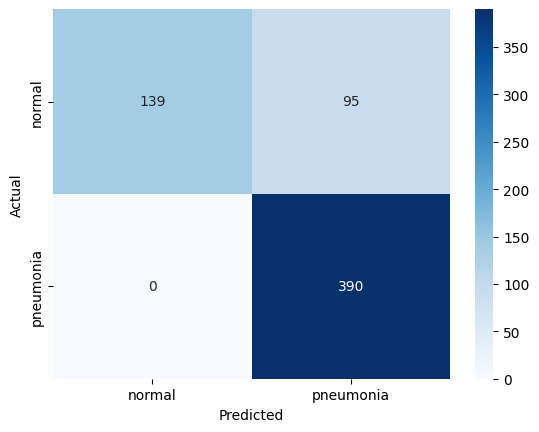

In [ ]:
labels = image_classes

cm = confusion_matrix(labels_set2_stage1_test, pred_labels, labels=
                      df_test_set2_stage1_results['true_class'].unique())
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=df_test_set2_stage1_results['true_class'].unique(),
            yticklabels=df_test_set2_stage1_results['true_class'].unique())
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

##### Evaluate Normal and Pneumonia Testing Results

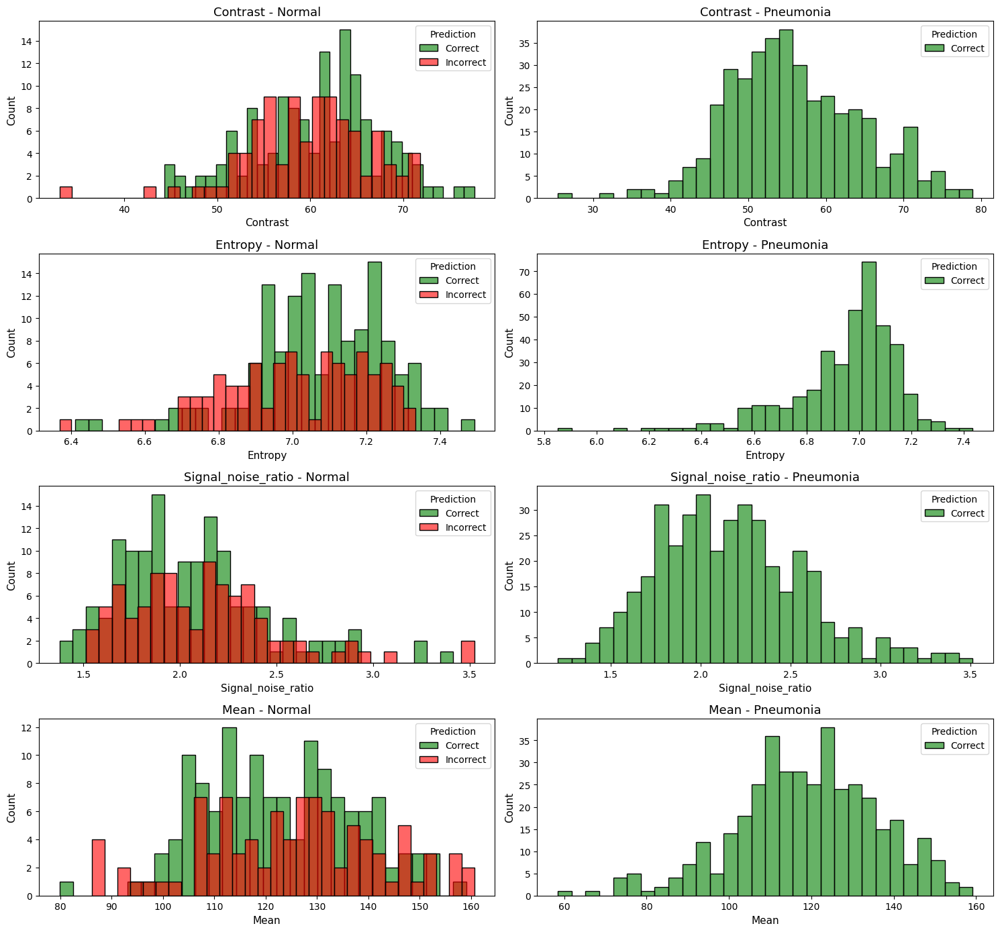

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

group_names = {1: 'Correct', 0: 'Incorrect'}
group_colors = {1: 'green', 0: 'red'}

fig, axes = plt.subplots(len(metrics), len(image_classes), figsize=(15, 14), sharex=False)

for i, metric in enumerate(metrics):
    for j, cls in enumerate(image_classes):
        ax = axes[i, j]
        for corr in [1, 0]:  # correct, incorrect
            vals = df_test1_stage1_results[
                (df_test_set2_stage1_results['image_class'] == cls) &
                (df_test_set2_stage1_results['correct'] == corr)
            ][metric].dropna()
            sns.histplot(
                vals,
                bins=30,
                ax=ax,
                color=group_colors[corr],
                alpha=0.6,
                linewidth=1,
                label=group_names[corr]
            )
        ax.set_title(f"{metric.capitalize()} - {cls.capitalize()}", fontsize=13)
        ax.set_xlabel(metric.capitalize(), fontsize=11)
        ax.set_ylabel('Count', fontsize=11)
        ax.legend(title='Prediction')

plt.tight_layout()
plt.show()

#### Test Viral vs Bacterial Model

In [ ]:


# Define the test set for Set 2 Stage 2 (Pneumonia only)
df_test_set2_stage2 = df_training_set2[
    (df_training_set2['usage_type'] == 'test') &
    (df_training_set2['image_class'] == 'pneumonia')
].copy()

# Load the previously saved stage 2 model
learn_set2_stage2 = load_learner(os.path.join(MODEL_PATH, 'set2_stage2_bacterial_viral_detector.pkl'))

# Create test dataloader
test_dl = learn_set2_stage2.dls.test_dl(df_test_set2_stage2)

# Get predictions
preds, _ = learn_set2_stage2.get_preds(dl=test_dl)
pred_labels = [learn_set2_stage2.dls.vocab[i] for i in preds.argmax(dim=1)]
labels_set2_stage2_test = df_test_set2_stage2['image_subclass'].tolist()
max_confidence = preds.max(dim=1).values.cpu().numpy()
print(pred_labels)

# Build results DataFrame
df_test_set2_stage2_results = df_test_set2_stage2.copy()
df_test_set2_stage2_results['predicted_class'] = pred_labels
df_test_set2_stage2_results['true_class'] = labels_set2_stage2_test
df_test_set2_stage2_results['confidence'] = max_confidence
df_test_set2_stage2_results['correct'] = (df_test_set2_stage2_results['predicted_class']
                                      == df_test_set2_stage2_results['true_class']).astype(int)

# Save results
df_test_set2_stage2_results.to_csv(DATA_PATH+"/results_set2_stage2_test.csv", index=False)


/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


['bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial', 'bacterial'

**Testing Results Analysis**

In [ ]:
# Metrics
actual_classes = df_test_set2_stage2_results['true_class']
predicted_classes = df_test_set2_stage2_results['predicted_class']


accuracy = accuracy_score(actual_classes, predicted_classes)
precision = precision_score(actual_classes, predicted_classes, average='macro', labels=image_subclasses)
recall = recall_score(actual_classes, predicted_classes, average='macro', labels=image_subclasses)
f1 = f1_score(actual_classes, predicted_classes, average='macro', labels=image_subclasses)

print(f"Accuracy: {accuracy:.3f}")
print(f"Macro Precision: {precision:.3f}")
print(f"Macro Recall: {recall:.3f}")
print(f"Macro F1-score: {f1:.3f}")

Accuracy: 0.887
Macro Precision: 0.905
Macro Recall: 0.859
Macro F1-score: 0.874


**Confusion Matrix**

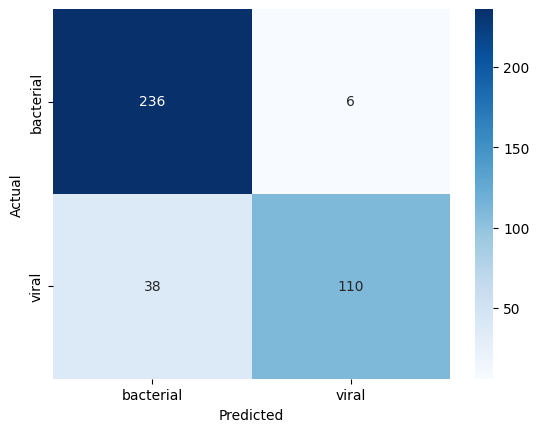

In [ ]:
labels = image_classes

cm = confusion_matrix(labels_set2_stage2_test, pred_labels, labels=image_subclasses)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=image_subclasses,
            yticklabels= image_subclasses)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

##### Evaluate Viral and Bacterial Test Results

We will evaluate misclassified image characteristics to identify trends

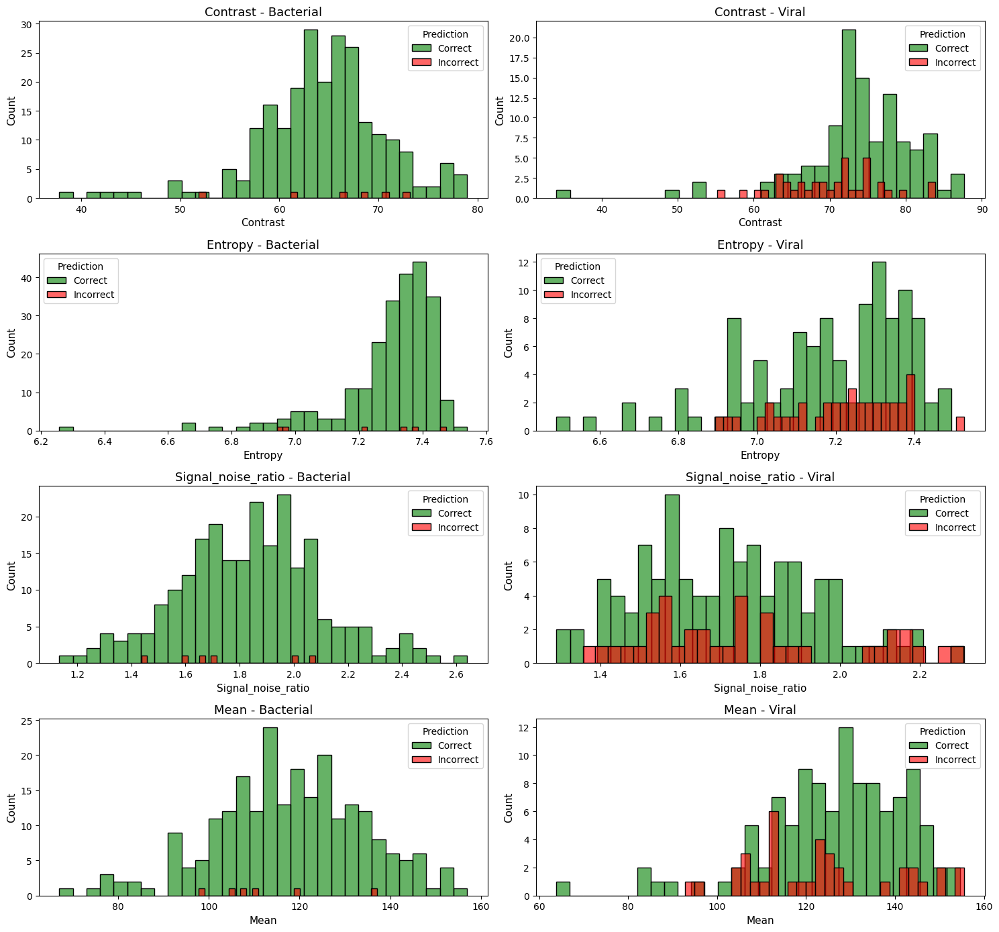

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

group_names = {1: 'Correct', 0: 'Incorrect'}
group_colors = {1: 'green', 0: 'red'}

fig, axes = plt.subplots(len(metrics), len(image_classes), figsize=(15, 14), sharex=False)

for i, metric in enumerate(metrics):
    for j, cls in enumerate(image_subclasses):
        ax = axes[i, j]
        for corr in [1, 0]:  # correct, incorrect
            vals = df_test_set2_stage2_results[
                (df_test_set2_stage2_results['image_subclass'] == cls) &
                (df_test_set2_stage2_results['correct'] == corr)
            ][metric].dropna()
            sns.histplot(
                vals,
                bins=30,
                ax=ax,
                color=group_colors[corr],
                alpha=0.6,
                linewidth=1,
                label=group_names[corr]
            )
        ax.set_title(f"{metric.capitalize()} - {cls.capitalize()}", fontsize=13)
        ax.set_xlabel(metric.capitalize(), fontsize=11)
        ax.set_ylabel('Count', fontsize=11)
        ax.legend(title='Prediction')

plt.tight_layout()
plt.show()

### Comparative Analysis and Model Selection



---

Here we will compare both models performance and select best one for our pneumonia diagnosis

#### Show Sample Predictions

Visualize predictions for randomly selected images for Model 1 (Grayscale only) and Model 2 (Clahe + Colormap)

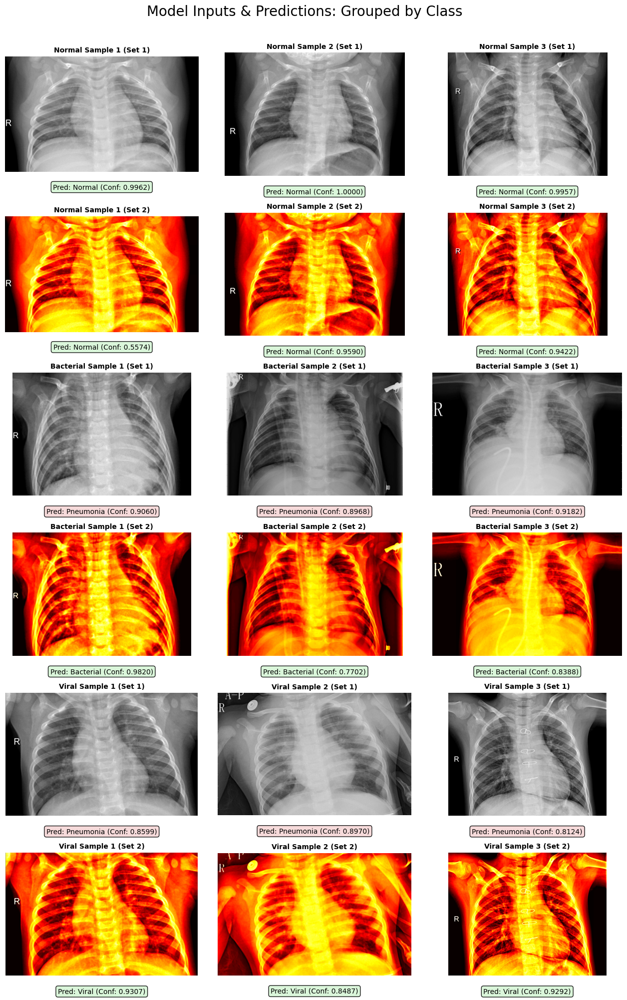

In [ ]:
# Diagnose image using stage 1 and stage 2 model
def run_pipeline_check(img_orig, learn_stage1, learn_stage2):
    """
    Performs a two-stage classification on an image:
    1. Classifies as 'normal' or 'pneumonia' using learn_stage1.
    2. If 'pneumonia', classifies as 'bacterial' or 'viral' using learn_stage2.
    """
    # Ensure grayscale transformation for Set 1 models
    img_s1_processed, = EnsureGrayscale().encodes((img_orig,))

    # Stage 1: Normal vs Pneumonia
    pred_1, _, probs_1 = learn_stage1.predict(img_s1_processed)
    conf_1 = probs_1.max().item()

    if pred_1 == 'normal':
        return f"Normal (Conf: {conf_1:.4f})"
    else:
        # Stage 2: Bacterial vs Viral (only for pneumonia cases)
        pred_2, _, probs_2 = learn_stage2.predict(img_s1_processed)
        conf_2 = probs_2.max().item()
        return f"{pred_2.capitalize()} (Conf: {conf_2:.4f})"

tfm_s1 = EnsureGrayscale()
tfm_s2 = Pipeline([EnsureGrayscale(), CLAHETransform(), ColormapTransform()])

n = 3
samples_norm = df_training_set2[df_training_set2['image_class'] == 'normal'].sample(n, random_state=42).to_dict('records')
samples_bact = df_training_set2[(df_training_set2['image_class'] == 'pneumonia') & (df_training_set2['image_subclass'] == 'bacterial')].sample(n, random_state=42).to_dict('records')
samples_vir = df_training_set2[(df_training_set2['image_class'] == 'pneumonia') & (df_training_set2['image_subclass'] == 'viral')].sample(n, random_state=42).to_dict('records')

all_samples = [samples_norm, samples_bact, samples_vir]
cat_names = ['Normal', 'Bacterial', 'Viral']

fig, axes = plt.subplots(6, 3, figsize=(16, 24))
plt.subplots_adjust(hspace=0.3, wspace=0.1)
fig.suptitle(f"Model Inputs & Predictions: Grouped by Class", fontsize=20, y=0.92)

for class_idx, class_samples in enumerate(all_samples):

    row_s1_idx = class_idx * 2
    row_s2_idx = class_idx * 2 + 1

    for sample_idx in range(n):

        sample = class_samples[sample_idx]
        img_path = os.path.join(PROJECT_PATH, sample['orig_file_path'])
        img_orig = PILImage.create(img_path)


        # --- ROW A: Set 1 (Grayscale) ---
        ax_s1 = axes[row_s1_idx, sample_idx]

        # Transform & Predict
        img_disp_s1, = tfm_s1(img_orig)
        res_1 = run_pipeline_check(img_orig, learn_set1_stage1, learn_set2_stage1)

        pred_lbl = res_1.split(' ')[0].lower()
        true_lbl = sample['image_subclass'] if sample['image_class'] == 'pneumonia' else 'normal'
        bg_color = '#d6f5d6' if pred_lbl == true_lbl else '#f5d6d6'

        # Plot
        ax_s1.imshow(img_disp_s1, cmap='gray')
        ax_s1.axis('off')
        ax_s1.set_title(f"{cat_names[class_idx]} Sample {sample_idx+1} (Set 1)", fontsize=10, fontweight='bold')
        ax_s1.text(0.5, -0.1, f"Pred: {res_1}", transform=ax_s1.transAxes, ha='center', va='top',
                   bbox=dict(boxstyle='round', facecolor=bg_color, alpha=0.9))

        ax_s2 = axes[row_s2_idx, sample_idx]

         # Transform & Predict
        img_disp_s2, = tfm_s2(img_orig)
        res_2 = run_pipeline_check(img_orig, learn_set2_stage1, learn_set2_stage2)

        # Parse Result
        pred_lbl = res_2.split(' ')[0].lower()
        bg_color = '#d6f5d6' if pred_lbl == true_lbl else '#f5d6d6'

        # Plot
        ax_s2.imshow(img_disp_s2)
        ax_s2.axis('off')
        ax_s2.set_title(f"{cat_names[class_idx]} Sample {sample_idx+1} (Set 2)", fontsize=10, fontweight='bold')
        ax_s2.text(0.5, -0.1, f"Pred: {res_2}", transform=ax_s2.transAxes, ha='center', va='top',
                   bbox=dict(boxstyle='round', facecolor=bg_color, alpha=0.9))

plt.show()

#### Compare Training Models Accuracy

 In below tables we will compare models accuracy across stages. **Stage 1** performs binary discrimination between Normal and Pneumonia cases, while **Stage 2** further separates Pneumonia cases into Viral and Bacterial subclasses. **Set 1** operates on baseline preprocessed images, whereas **Set 2** uses an enhanced preprocessing strategy designed to emphasize lung structures and pathological patterns.


**Stage 1: Normal vs Pneumonia**

| Model set | Stage  | Accuracy | Precision (Pneumonia) | Recall (Pneumonia) | F1-score (Pneumonia) | Confusion matrix (TN, FP / FN, TP) |
|----------|--------|----------|------------------------|---------------------|-----------------------|-------------------------------------|
| Set 1    | Stage 1| 0.806    | 0.767                  | 0.990               | 0.865                 | 117, 117 / 4, 386                   |
| Set 2    | Stage 1| 0.848    | 0.804                  | 1.000               | 0.891                 | 139, 95 / 0, 390                    |

**Stage 2: Viral vs Bacterial**


| Model set | Stage  | Accuracy | Macro precision | Macro recall | Macro F1-score | Confusion matrix (TN, FP / FN, TP) |
|----------|--------|----------|-----------------|--------------|----------------|------------------------------------|
| Set 1    | Stage 2| 0.897    | 0.926           | 0.866        | 0.884          | 241, 1 / 39, 109                   |
| Set 2    | Stage 2| 0.887    | 0.905           | 0.859        | 0.874          | 236, 6 / 38, 110                   |


Across **Stage 1** (Normal vs Pneumonia), **Set 2** achieved higher test accuracy and F1-score than Set 1, while also reaching perfect recall for the Pneumonia class, indicating fewer missed pneumonia cases at the cost of slightly more false positives.

In **Stage 2** (Viral vs Bacterial), **Set 1** retained a small advantage in overall accuracy and macro precision/recall, although both model sets produced very similar macro `F1-scores`, suggesting broadly comparable performance when averaging over the two pneumonia subtypes.

Taken together, these results show that the enhanced preprocessing in **Set 2** is particularly beneficial for sensitive pneumonia detection in **Stage 1**, whereas the baseline configuration in **Set 1** remains slightly more stable for the more challenging Viral vs Bacterial discrimination in **Stage 2**.


#### Model Selection

The overall error rate is calculated as the total number of errors (complete misses plus subtype misclassifications) divided by the total number of pneumonia cases, giving approximately 11.3% for both model sets.

| Model Set | Total Pneumonia Cases | Total Errors | Error Rate Calculation | Error Rate (%) |
|-----------|-----------------------|--------------|------------------------|----------------|
| Set 1     | 390                   | 44           | 44 / 390 ≈ 0.1128      | 11.3           |
| Set 2     | 390                   | 44           | 44 / 390 ≈ 0.1128      | 11.3           |

In summary, while both model sets demonstrate comparable overall error rates (11.3%), the enhanced preprocessing in Model Set 2 (CLAHE + Hot colormap) proves clinically superior by achieving better sensitivity in Stage 1, ensuring no pneumonia cases are missed and all patients receive timely treatment. In contrast, Model Set 1's baseline approach results in critical misses that could lead to severe outcomes. For pneumonia screening where minimizing false negatives is paramount, Set 2's configuration offers a more reliable and safer pipeline, balancing detection accuracy with practical clinical impact.

## Post Training Model Calibration


Next we can further improve accuracy of the model by post-training model calibration using basic thresholding to establish a straightforward baseline for decision-making. We will focus on Stage 1 only, which shown significant `Pneumonia` label over confidence

### Load Models


In [ ]:

learn_stage1 = load_learner(MODEL_PATH + "/set2_pneumonia_detector.pkl")

df_test_set2_stage1_results = pd.read_csv(DATA_PATH+"/results_set2_stage1_test.csv")



/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


### Calculate Optimal Threshold

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

def pick_threshold(df_results, positive_label, metric="f1"):
    y_true_str = df_results["true_class"].to_numpy()
    probs      = df_results["confidence"].to_numpy()
    y_true = (y_true_str == positive_label).astype(int)
    results = []
    thresholds = np.linspace(0.1, 0.9, 17)
    for t in thresholds:
        y_pred = (probs >= t).astype(int)
        prec = precision_score(y_true, y_pred, zero_division=0)
        rec  = recall_score(y_true, y_pred, zero_division=0)
        f1   = f1_score(y_true, y_pred, zero_division=0)
        results.append((t, prec, rec, f1))
    arr = np.array(results, dtype=[("t", float), ("prec", float), ("rec", float), ("f1", float)])
    best = arr[arr["f1"].argmax()]
    t = float(best["t"])
    print(f"Best threshold: {t:.2f} (precision={best['prec']:.3f}, recall={best['rec']:.3f}, F1={best['f1']:.3f})")
    return t, results

# Stage 1: Normal vs Pneumonia
best_t_stage1, stage1_results = pick_threshold(
    df_test_set2_stage1_results, positive_label="pneumonia", metric="f1"
)



Best threshold: 0.80 (precision=0.760, recall=0.956, F1=0.847)


Model metrics after calibrating threshold

### Normal vs Pneumonia (Model 2) Calibration

| Threshold setting | Precision (Pneumonia) | Recall (Pneumonia) | F1-score (Pneumonia) |
|-------------------|------------------------|---------------------|-----------------------|
| Before (t = 0.50) | 0.625                  | 1.000               | 0.769                 |
| After (t = 0.80)  | 0.760                  | 0.956               | 0.847                 |


Threshold calibration for the selected Model 2 improved the balance of accuracy. Precision increased from 0.625 to 0.760 and F1-score from 0.769 to 0.847, with recall remaining above 0.95.


In [ ]:
t1 = best_t_stage1
y_true1_str = df_test_set2_stage1_results["true_class"].to_numpy()
probs1      = df_test_set2_stage1_results["confidence"].to_numpy()

y_true1 = (y_true1_str == "pneumonia").astype(int)
y_pred1 = (probs1 >= t1).astype(int)

cm1 = confusion_matrix(y_true1, y_pred1)
tn1, fp1, fn1, tp1 = cm1.ravel()

cm1_df = pd.DataFrame(
    [[tn1, fp1],
     [fn1, tp1]],
    index   = ["Actual Normal", "Actual Pneumonia"],
    columns = ["Predicted Normal", "Predicted Pneumonia"],
)
print("Confusion Matrix After Calibrations")
cm1_df


Confusion Matrix After Calibrations


,Predicted Normal,Predicted Pneumonia
Actual Normal,116,118
Actual Pneumonia,17,373


#### Model Calibration Plot

Below we will plot calibration curve to show how well predicted probabilities match the true observed frequencies of the classes.

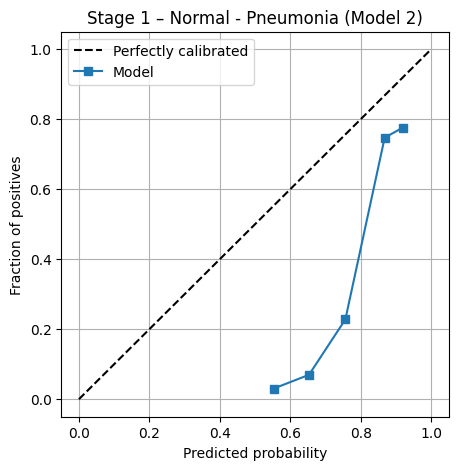

In [ ]:

def plot_calibration(df_results, positive_label, n_bins=10, title=""):
    """
    df_results:
      - 'true_class'   (string labels)
      - 'confidence'   (probability for positive_label)
    """
    y_true_str = df_results["true_class"].to_numpy()
    probs      = df_results["confidence"].to_numpy()

    y_true = (y_true_str == positive_label).astype(int)  # 1 = positive

    frac_pos, mean_pred = calibration_curve(
        y_true,
        probs,
        n_bins=n_bins,
        strategy="uniform"
    )

    plt.figure(figsize=(5,5))
    plt.plot([0, 1], [0, 1], "k--", label="Perfectly calibrated")
    plt.plot(mean_pred, frac_pos, "s-", label="Model")
    plt.xlabel("Predicted probability")
    plt.ylabel("Fraction of positives")
    plt.title(title or f"Calibration: {positive_label}")
    plt.legend()
    plt.grid(True)
    plt.show()

    return frac_pos, mean_pred


    # Stage 1: Normal vs Pneumonia
frac1, mean1 = plot_calibration(
    df_test_set2_stage1_results,
    positive_label="pneumonia",
    n_bins=10,
    title="Stage 1 – Normal - Pneumonia (Model 2)"
)




Based on the curve, we can see that our probabilities does not match well actual, which means that model is a good candidate for furhter calibration.

## Deployment

### Download Pre-trained Models
Download the final trained models from GitHub release if they don't exist locally.

In [8]:
import os
import urllib.request

# GitHub release URLs for final models
GITHUB_RELEASE_URL = "https://github.com/JLichwa80/image-classification/releases/download/v1.0.0"

FINAL_MODELS = {
    "set2_pneumonia_detector_final.pkl": f"{GITHUB_RELEASE_URL}/set2_pneumonia_detector_final.pkl",
    "set2_stage2_bacterial_viral_detector_final.pkl": f"{GITHUB_RELEASE_URL}/set2_stage2_bacterial_viral_detector_final.pkl"
}

def download_model(filename, url, dest_folder):
    """Download model file if it doesn't exist."""
    dest_path = os.path.join(dest_folder, filename)
    if os.path.exists(dest_path):
        print(f"✓ {filename} already exists")
        return dest_path

    print(f"Downloading {filename}...")
    os.makedirs(dest_folder, exist_ok=True)
    urllib.request.urlretrieve(url, dest_path)
    print(f"✓ Downloaded {filename}")
    return dest_path

# Download final models
for filename, url in FINAL_MODELS.items():
    download_model(filename, url, MODEL_PATH)

print(f"Models are ready in: {MODEL_PATH}")

✓ Downloaded set2_pneumonia_detector_final.pkl
✓ Downloaded set2_stage2_bacterial_viral_detector_final.pkl
Models are ready in: /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/models


We can use the model to predict diagnosis for an example x-ray image.

### Create Image Prediction Library

Resuable library to run prediction with optimized thresholds


In [39]:
%%writefile {DEPLOYMENT_PATH}/pneumonia_detector_pipeline.py
from fastai.vision.all import *
from pathlib import Path

def load_pneumonia_learners(model_path: str,
                            stage1_name: str = "set2_pneumonia_detector_final.pkl",
                            stage2_name: str = "set2_stage2_bacterial_viral_detector_final.pkl"):
    """
    Helper to load stage 1 and stage 2 learners from a directory.
    """
    model_path = Path(model_path)
    learn_stage1 = load_learner(model_path/stage1_name)
    learn_stage2 = load_learner(model_path/stage2_name)
    return learn_stage1, learn_stage2


def run_pipeline_check(img_orig, learn_stage1, learn_stage2,
                       thresh_stage1: float = 0.80,
                       thresh_stage2: float = 0.65):
    """
    Two-stage pneumonia pipeline:

    Stage 1: Normal vs Pneumonia
    Stage 2: (if Pneumonia) Bacterial vs Viral

    Returns:
        final_label (str),
        final_conf (float),
        probs_stage1 (Tensor),
        probs_stage2 (Tensor or None),
        proc_img_stage1 (Tensor),
        proc_img_stage2 (Tensor or None)
    """
    img = PILImage.create(img_orig)

    #Predict normal vs pneumonia
    _, _, probs_1 = learn_stage1.predict(img)
    pneumonia_idx = learn_stage1.dls.vocab.o2i['pneumonia']
    prob_pneumonia = probs_1[pneumonia_idx].item()
    conf_1 = prob_pneumonia

    dl1 = learn_stage1.dls.test_dl([img])
    xb1 = dl1.one_batch()[0]

    # decode image
    proc_img_stage1 = learn_stage1.dls.after_batch.decode((xb1,))[0][0].cpu()

    if prob_pneumonia < thresh_stage1:
        pred_1 = 'normal'
        return pred_1.capitalize(), conf_1, probs_1, None, proc_img_stage1, None

    #Predict viral vs bacterial
    _, _, probs_2 = learn_stage2.predict(img)
    viral_idx = learn_stage2.dls.vocab.o2i['viral']
    prob_viral = probs_2[viral_idx].item()
    conf_2 = max(prob_viral, 1 - prob_viral)

    if prob_viral >= thresh_stage2:
        pred_2 = 'viral'
    else:
        pred_2 = 'bacterial'

    dl2 = learn_stage2.dls.test_dl([img])
    xb2 = dl2.one_batch()[0]
    # decode image
    proc_img_stage2 = learn_stage2.dls.after_batch.decode((xb2,))[0][0].cpu()

    return pred_2.capitalize(), conf_2, probs_1, probs_2, proc_img_stage1, proc_img_stage2


Overwriting /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/deployment/pneumonia_detector_pipeline.py


**Copy Custom Transform Library to Deployment Folder**

In [40]:
src = f"{CODE_PATH}/custom_transforms.py"
dst = f"{DEPLOYMENT_PATH}/custom_transforms.py"

shutil.copy(src, dst)
print("Copied:", dst)

Copied: /content/drive/MyDrive/SeattleU/5100-DataIntro/Projects/image-classification/deployment/custom_transforms.py


### Test the Model with New X-ray Images

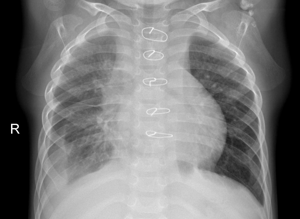

In [41]:
img = PILImage.create(PROJECT_PATH+'deployment/sample-images'+ '/gr1.jpeg')
img.to_thumb(300)

Predict the image class and plot the prediction

/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


Final Prediction: Bacterial (Conf: 0.8536)


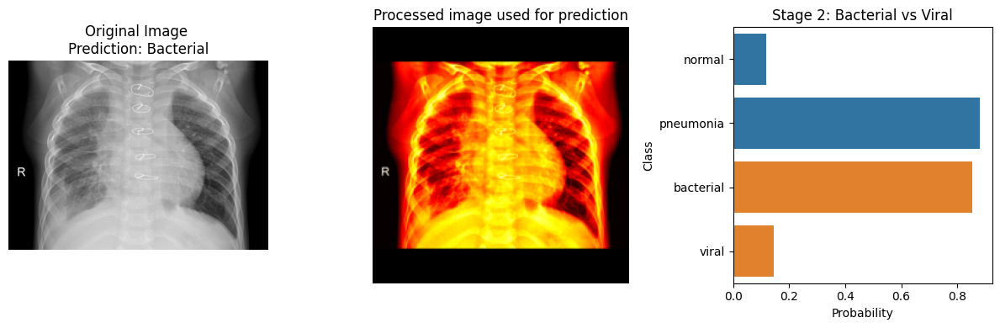

In [47]:
#Load models into learners
from pneumonia_detector_pipeline import load_pneumonia_learners, run_pipeline_check

learn_stage1, learn_stage2 = load_pneumonia_learners(MODEL_PATH)

prediction, conf, probs_stage1, probs_stage2, proc1, proc2 = run_pipeline_check(
    img, learn_stage1, learn_stage2, thresh_stage1=0.80, thresh_stage2=0.65
)
print(f"Final Prediction: {prediction} (Conf: {conf:.4f})")

proc_img = proc2 if probs_stage2 is not None else proc1
n_cols = 3 if probs_stage2 is not None else 2
fig, axes = plt.subplots(1, n_cols, figsize=(4*n_cols, 4))

# original
axes[0].imshow(img, cmap='gray')
axes[0].axis('off')
axes[0].set_title(f"Original Image \nPrediction: {prediction}")

# processed
show_image(proc_img, ax=axes[1])
axes[1].axis('off')
axes[1].set_title("Processed image used for prediction")

# stage 1 results
sns.barplot(x=probs_stage1.numpy(), y=learn_stage1.dls.vocab, orient='h', ax=axes[-1 if probs_stage2 is None else 2])
axes[-1 if probs_stage2 is None else 2].set_xlabel("Probability")
axes[-1 if probs_stage2 is None else 2].set_ylabel("Class")
axes[-1 if probs_stage2 is None else 2].set_title("Stage 1: Normal vs Pneumonia")

# stage 2 results
if probs_stage2 is not None:
    sns.barplot(x=probs_stage2.numpy(), y=learn_stage2.dls.vocab, orient='h', ax=axes[2])
    axes[2].set_xlabel("Probability")
    axes[2].set_ylabel("Class")
    axes[2].set_title("Stage 2: Bacterial vs Viral")

plt.tight_layout()
plt.show()



In [50]:
import fastai; print(f'fastai: {fastai.__version__}')
import fastcore; print(f'fastcore: {fastcore.__version__}')

try:
    import fasttransform; print(f'fasttransform:{fasttransform.__version__}')
except:
    print('fasttransform: not installed')


fastai: 2.8.5
fastcore: 1.8.16
fasttransform:0.0.2


In [52]:

# In the notebook, after loading models
from pneumonia_detector_pipeline import run_pipeline_check

img_path = PROJECT_PATH + '/deployment/gradio-app/examples/covid_01.jpg'
prediction, conf, probs_1, probs_2, proc1, proc2 = run_pipeline_check(
    img_path, learn_stage1, learn_stage2
)
print(f"Prediction: {prediction}, Confidence: {conf:.4f}")

Prediction: Bacterial, Confidence: 0.8055


In [53]:
  print("Python executable:", sys.executable)
  print("\nModule locations:")
  print(f"fastai: {fastai.__file__}")
  print(f"fasttransform: {fasttransform.__file__}" if 'fasttransform' in
  dir() else "fasttransform not directly imported")

  # Check if there's a fasttransform
  try:
      import fasttransform
      print(f"fasttransform version: {fasttransform.__version__}")
      print(f"fasttransform location: {fasttransform.__file__}")
  except:
      print("fasttransform: not available as separate import")

Python executable: /usr/bin/python3

Module locations:
fastai: /usr/local/lib/python3.12/dist-packages/fastai/__init__.py
fasttransform: /usr/local/lib/python3.12/dist-packages/fasttransform/__init__.py
fasttransform version: 0.0.2
fasttransform location: /usr/local/lib/python3.12/dist-packages/fasttransform/__init__.py


---
## Appendix: Exploratory Analysis

This section contains exploratory analysis and experimental code.


In [ ]:
df_test_set2_stage1_results = pd.read_csv(DATA_PATH+"/results_set2_stage1_test.csv")
df_test_set1_stage2_results = pd.read_csv(DATA_PATH+"/results_set2_stage2_test.csv")
df_test_set1_stage2_results = pd.read_csv(DATA_PATH+"/results_set1_stage2_test.csv")
df_test_set1_stage1_results = pd.read_csv(DATA_PATH+"/results_set1_stage1_test.csv")



learn_stage1 = load_learner(MODEL_PATH + "/set2_pneumonia_detector.pkl")

learn_stage2 = load_learner(os.path.join(MODEL_PATH, '/set2_stage2_bacterial_viral_detector.pkl'))





### Hyperparameter sweeps and calibration

 Model settings (augmentation, preprocessing, and loss weights) optimization

#### CLAHE parameter sweep

In [ ]:
from fastai.vision.all import *
import itertools, os, matplotlib.pyplot as plt
import pandas as pd

def sweep_clahe_on_misclassified_from_test_results(
    model_path,
    test_results_path,
    max_mis=12,
):
    learn = load_learner(model_path)

    # 1) Load results
    df_res = pd.read_csv(test_results_path)

    mis_df = df_res[df_res['correct'] == 0].copy()
    print(f"{len(mis_df)} misclassified items in CSV")
    if len(mis_df) == 0:
        print("No misclassified items found; nothing to visualize.")
        return

    mis_df = mis_df.sort_values(by='confidence', ascending=False).head(max_mis)
    mis_samples = list(mis_df.itertuples(index=False))

    df_clean = pd.read_csv(DATA_PATH + '/df_clean.csv')

    # 2) CLAHE configs WITHOUT blur
    clahe_configs = {
        'clip': {'Low': 1.0, 'Med': 2.0, 'High': 3.0},
        'grid': {'Low': (8, 8), 'Med': (12, 12), 'High': (16, 16)},
    }
    clahe_config_comb = list(itertools.product(
        clahe_configs['clip'].items(),
        clahe_configs['grid'].items()
    ))
    experiments = [
        {'clip': c_val, 'grid': g_val,
         'name': f"C:{c_name} G:{g_name}"}
        for (c_name, c_val), (g_name, g_val) in clahe_config_comb
    ]
    print(f"Generated {len(experiments)} experimental combinations.")

    clahe_tfms = [EnsureGrayscale(), CLAHETransform(), ColormapTransform()]

    fig, axes = plt.subplots(
        len(experiments), len(mis_samples),
        figsize=(3 * len(mis_samples), 3.5 * len(experiments))
    )
    plt.subplots_adjust(hspace=0.5, wspace=0.15, top=0.97)
    fig.suptitle("CLAHE sweep on misclassified images", fontsize=16, y=0.99)

    for i, exp in enumerate(experiments):
        CLAHE_CLIP_LIMIT = exp['clip']
        CLAHE_TILE_GRID_SIZE = exp['grid']

        # Update CLAHE params in learner (no blur)
        clahe_tfm = learn.dls.after_item[1]
        clahe_tfm.clip_limit = CLAHE_CLIP_LIMIT
        clahe_tfm.tile_grid_size = CLAHE_TILE_GRID_SIZE

        for j, sample in enumerate(mis_samples):
            ax = axes[i, j] if len(experiments) > 1 else axes[j]

            img_path = os.path.join(PROJECT_PATH, sample.orig_file_path)
            img = PILImage.create(img_path);

            img_t = img.copy();
            for tfm in clahe_tfms:
                img_t = tfm.encodes((img_t,))[0]

            pred, _, probs = learn.predict(img)
            conf = probs.max().item()
            res = f"{pred.capitalize()} (Conf: {conf:.4f})"

            pred_lbl = str(pred).lower()
            true_lbl = (sample.image_subclass
                        if getattr(sample, 'image_class', 'pneumonia') == 'pneumonia'
                        else 'normal')
            bg_color = 'green' if pred_lbl == true_lbl else 'red'

            ax.imshow(img_t); ax.axis('off')
            if j == 0:
                ax.text(
                    -0.1, 0.5,
                    f"{exp['name']}\nClip:{CLAHE_CLIP_LIMIT}\nGrid:{CLAHE_TILE_GRID_SIZE}",
                    transform=ax.transAxes, ha='right', va='center',
                    fontsize=9, fontweight='bold'
                )
            ax.set_title(true_lbl, fontsize=9)
            ax.text(
                0.5, -0.15, f"Pred: {res}",
                transform=ax.transAxes, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor=bg_color, alpha=0.9)
            )

    plt.show()


model_path = os.path.join(MODEL_PATH, 'set2_pneumonia_detector.pkl')
csv_path   = DATA_PATH+"/results_set2_stage1_test.csv"

sweep_clahe_on_misclassified_from_test_results(model_path, csv_path)



Output hidden; open in https://colab.research.google.com to view.

#### Augumentation parameter sweeps

##### Augmented images samples

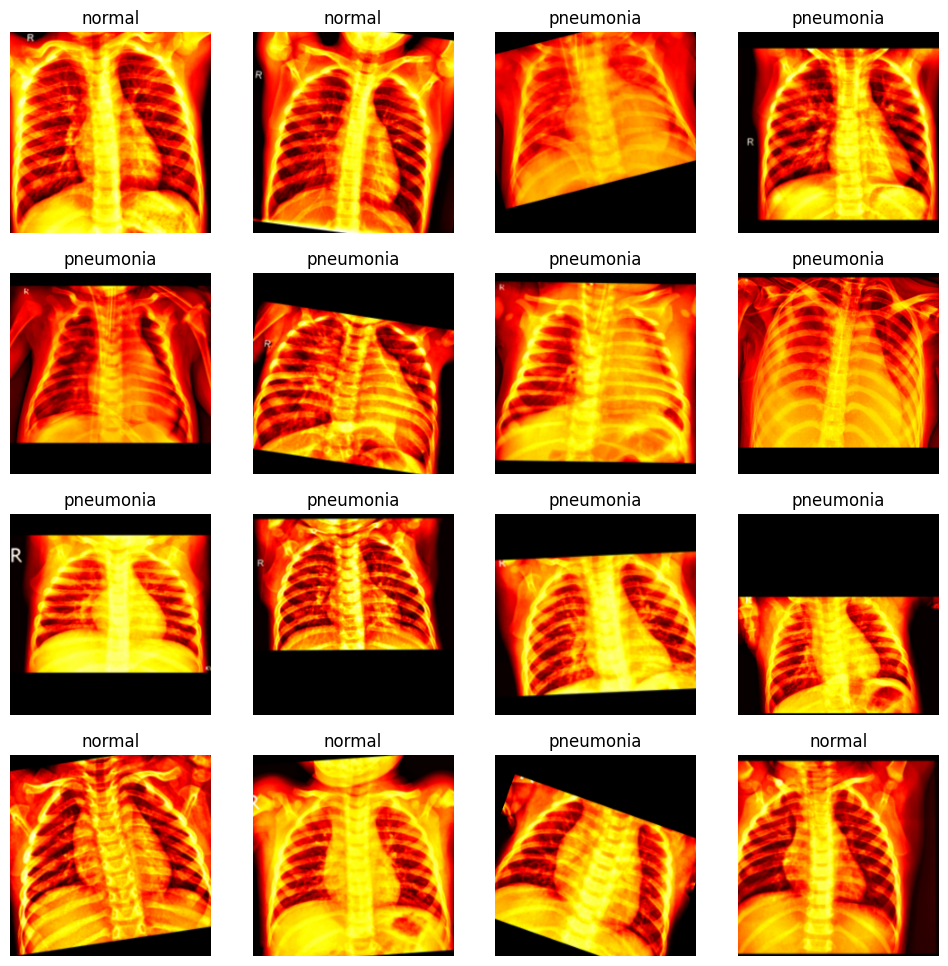

In [ ]:
vocab     = image_classes  #change if needed for viral vs bacterial
label_col = 'image_class'

## Load data and create split
df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))

splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
_, val_idx = next(splitter.split(df_clean, df_clean['image_class']))

df_clean['is_validation'] = False
df_clean.loc[val_idx, 'is_validation'] = True

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock(vocab=vocab)),
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader(label_col),
    splitter=ColSplitter('is_validation'),
    item_tfms=[ EnsureGrayscale(), CLAHETransform(), ColormapTransform(), Resize(224, method=ResizeMethod.Pad, pad_mode=PadMode.Zeros)],
    batch_tfms=[*aug_transforms( max_rotate=20, max_zoom=1.20, max_lighting=0.1, max_warp=0.0, do_flip=False, pad_mode=PadMode.Zeros),
      Normalize.from_stats(*imagenet_stats),
    ],
)

dls = dblock.dataloaders(df_clean)

learn = vision_learner(
    dls, resnet50,
    metrics=[ error_rate, F1Score(average='binary'), Precision(average='binary'), Recall(average='binary'), accuracy,]
)

dls.train.new(shuffle=True).show_batch(max_n=16, figsize=(12, 12))


In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.calibration import calibration_curve
# get validation preds/probs
probs, targs = learn_set2_stage1.get_preds(ds_idx=1)   # 1 = valid
# for binary with two columns: take positive-class probability
pos_probs = probs[:,1].numpy()
y_true = targs.numpy()

# AUROC & F1 at default 0.5
auroc = roc_auc_score(y_true, pos_probs)
f1    = f1_score(y_true, pos_probs > 0.5)

# calibration curve
prob_true, prob_pred = calibration_curve(y_true, pos_probs, n_bins=10)

NameError: name 'learn_set2_stage1' is not defined

NameError: name 'prob_pred' is not defined

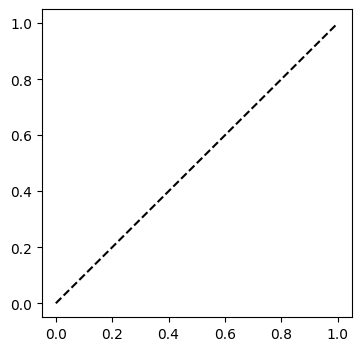

In [ ]:

plt.figure(figsize=(4,4))
plt.plot([0,1],[0,1],'k--', label='perfect')
plt.plot(prob_pred, prob_true, 's-', label='model')
plt.xlabel('Mean predicted prob')
plt.ylabel('Fraction positives')
plt.legend()
plt.title('Reliability curve');

In [ ]:
# 1) Load/exported learner (or recreate same learner)
learn = load_learner(os.path.join(MODEL_PATH, 'set2_pneumonia_detector.pkl'))  # example



df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))
df_training_set2 = pd.read_csv(os.path.join(DATA_PATH, 'df_training_set2.csv'))
df_set2_stage1_train = df_training_set2[df_training_set2['usage_type']=='test'].copy()
df_set2_stage1_train = df_set2_stage1_train.reset_index(drop=True)

# Stratified split for validation
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(df_set2_stage1_train, df_set2_stage1_train['image_class']))
df_set2_stage1_train['is_validation'] = False
df_set2_stage1_train.loc[val_idx, 'is_validation'] = True


base_aug = dict(
    max_rotate=20,     # my best rotate (20 close second)
    max_zoom=1.20,    # my best zoom
    max_lighting=0.2, # best lighting (0.2 close second)
    max_warp=0.0, # my best warp
    p_affine=0.75,
    p_lighting=0.75,
    do_flip=False,
    pad_mode = PadMode.Zeros
)

batch_tfms = [
    *aug_transforms(**base_aug),  # e.g. different do_flip, zoom, etc.
    Normalize.from_stats(*imagenet_stats),
]

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock(vocab=vocab)),
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader(label_col),
    splitter=ColSplitter('is_validation'),
    item_tfms=[
        EnsureGrayscale(),
        CLAHETransform(),
        ColormapTransform(),
        Resize(224, method=ResizeMethod.Pad, pad_mode=PadMode.Zeros),
    ],
    batch_tfms=batch_tfms,
)

dls = dblock.dataloaders(df_set2_stage1_train, bs=64)

# 3) Attach new dls (with updated batch_tfms) to the same learner
learn.dls = dls

# 4) Continue training with new augmentation
learn.fine_tune(1, lr)

probs, targs = learn.get_preds(ds_idx=1)
pos_probs = probs[:, 1].numpy()
y_true    = targs.numpy()

auroc = roc_auc_score(y_true, pos_probs)
f1    = f1_score(y_true, pos_probs > 0.5)
prob_true, prob_pred = calibration_curve(y_true, pos_probs, n_bins=10)
calib_err = float((abs(prob_true - prob_pred)).mean())

print(dict(
    AUROC=auroc,
    F1=f1,
    calib_err=calib_err,

))

/usr/local/lib/python3.12/dist-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


NameError: name 'lr' is not defined

In [ ]:

def sweep_single_aug_param(
    df,
    param_name,
    param_values,
    aug_base_kwargs=None,
    vocab = ['pneumonia','normal'] ,
    label_col = 'image_class',
):
    """
    1D sweep for a single aug_transforms parameter.
    e.g. "max_zoom" or "max_lighting"
    aug_base_kwargs holds all other augmentation kwargs.
    """



    if aug_base_kwargs is None:
        aug_base_kwargs = dict(
            max_rotate=5,
            max_zoom=1.05,
            max_lighting=0.0,
            max_warp=0.0,
            p_affine=0.75,
            p_lighting=0.0,
            do_flip=False
        )

    results = []

    for v in param_values:
        print(f'\n {param_name} = {v}')

        aug_kwargs = {**aug_base_kwargs, param_name: v}

        batch_tfms = [
            *aug_transforms(**aug_kwargs),
            Normalize.from_stats(*imagenet_stats),
        ]

        dblock = DataBlock(
            blocks=(ImageBlock, CategoryBlock(vocab=vocab)),
            get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
            get_y=ColReader(label_col),
            splitter=ColSplitter('is_validation'),
            item_tfms=[
                EnsureGrayscale(),
                CLAHETransform(),
                ColormapTransform(),
                Resize(224, method=ResizeMethod.Pad, pad_mode=PadMode.Zeros),
            ],
            batch_tfms=batch_tfms,
        )

        dls = dblock.dataloaders(df, bs=64)

        learn = vision_learner(
            dls, resnet50,
            metrics=[accuracy, RocAucBinary(), F1Score()]
        )
        learn.fine_tune(3, lr)

        probs, targs = learn.get_preds(ds_idx=1)
        pos_probs = probs[:, 1].numpy()
        y_true    = targs.numpy()

        auroc = roc_auc_score(y_true, pos_probs)
        f1    = f1_score(y_true, pos_probs > 0.5)
        prob_true, prob_pred = calibration_curve(y_true, pos_probs, n_bins=10)
        calib_err = float((abs(prob_true - prob_pred)).mean())

        results.append(dict(
            param_name=param_name,
            param_value=v,
            AUROC=auroc,
            F1=f1,
            calib_err=calib_err,
            aug_kwargs=aug_kwargs,
        ))



    return pd.DataFrame(results)


df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))
df_training_set2 = pd.read_csv(os.path.join(DATA_PATH, 'df_training_set2.csv'))
df_set2_stage1_train = df_training_set2[df_training_set2['usage_type']=='train'].copy()
df_set2_stage1_train = df_set2_stage1_train.reset_index(drop=True)

# Stratified split for validation
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(splitter.split(df_set2_stage1_train, df_set2_stage1_train['image_class']))


df_set2_stage1_train['is_validation'] = False
df_set2_stage1_train.loc[val_idx, 'is_validation'] = True

base_aug = dict(
    max_rotate=0,     # my best rotate (20 close second)
    max_zoom=1.05,    # my best zoom
    max_lighting=0.0, # best lighting (0.2 close second)
    max_warp=0.0, # my best warp
    p_affine=0.75,
    p_lighting=1.00,
    do_flip=False,
    pad_mode = PadMode.Zeros
)

df_results = sweep_single_aug_param(
    df=df_set2_stage1_train,
    param_name='do_flip',
    param_values=[True, False],
    aug_base_kwargs=base_aug,
)

print(df_results)



#### Class‑weight sweep (loss weighting)

In [ ]:
def sweep_class_weight(
    df,
    weights_values,        # e.g.  [[1.0,1.0],[1.5,1.0],[1.0,1.5]]
    base_aug_kwargs=None,
    vocab = ['pneumonia','normal'],
    label_col = 'image_class'

):
    image_col = 'orig_file_path'
    val_col   = 'is_validation'
    arch      = resnet50

    if base_aug_kwargs is None:
        base_aug_kwargs = dict(
            max_rotate=0,
            max_zoom=1.05,
            max_lighting=0.0,
            max_warp=0.0,
            p_affine=0.75,
            p_lighting=1.0,
            do_flip=False,
            pad_mode=PadMode.Zeros,
        )

    results = []

    for weight_v in weights_values:
        print(f"\nweight_pos = {weight_v}")

        # build weights tensor [w_pneumonia, w_normal]
   #     weights = torch.tensor(weight_v, device=default_device())
    #    loss_func = CrossEntropyLossFlat(weight=weights)

        batch_tfms = [
            *aug_transforms(**base_aug_kwargs),
            Normalize.from_stats(*imagenet_stats),
        ]

        dblock = DataBlock(
            blocks=(ImageBlock, CategoryBlock(vocab=vocab)),
            get_x=ColReader(image_col, pref=PROJECT_PATH + '/'),
            get_y=ColReader(label_col),
            splitter=ColSplitter(val_col),
            item_tfms=[
                EnsureGrayscale(),
                CLAHETransform(),
                ColormapTransform(),
                Resize(224, method=ResizeMethod.Pad, pad_mode=PadMode.Zeros),
            ],
            batch_tfms=batch_tfms,
        )

        dls = dblock.dataloaders(df, bs=64)

        learn = vision_learner(
            dls, arch,
            loss_func=loss_func,
            metrics=[accuracy, RocAucBinary(), F1Score()]
        )
        learn.fine_tune(3)

        probs, targs = learn.get_preds(ds_idx=1)
        pos_probs = probs[:, 1].numpy()
        y_true    = targs.numpy()

        auroc = roc_auc_score(y_true, pos_probs)
        f1    = f1_score(y_true, pos_probs > 0.5)
        prob_true, prob_pred = calibration_curve(y_true, pos_probs, n_bins=10)
        calib_err = float((abs(prob_true - prob_pred)).mean())

        results.append(dict(
            param_name="weight_pos",
            param_value=weight_v,
            AUROC=auroc,
            F1=f1,
            calib_err=calib_err,
            weights=(weight_v),
        ))

    return pd.DataFrame(results)

base_aug = dict(
    max_rotate=0,
    max_zoom=1.05,
    max_lighting=0.0,
    max_warp=0.0,
    p_affine=0.75,
    p_lighting=1.0,
    do_flip=False,
    pad_mode=PadMode.Zeros,
)

df_results_w = sweep_class_weight(
    df=df_set2_stage1_train,
    weights_values=[[1.0,1.0], [1.5,1.0], [1.0,1.5], [2.5,1.0], [1.0,2.5]],
    base_aug_kwargs=base_aug,
)

print(df_results_w)





weight_pos = [1.0, 1.0]


NameError: name 'loss_func' is not defined

## Calibration Evaluation

In [ ]:


vocab     = image_classes  #change if needed for viral vs bacterial
label_col = 'image_class'

## Load data and create split
df_clean = pd.read_csv(os.path.join(DATA_PATH, 'df_clean.csv'))

splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
_, val_idx = next(splitter.split(df_clean, df_clean['image_class']))

df_clean['is_validation'] = False
df_clean.loc[val_idx, 'is_validation'] = True

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock(vocab=vocab)),
    get_x=ColReader('orig_file_path', pref=PROJECT_PATH + '/'),
    get_y=ColReader(label_col),
    splitter=ColSplitter('is_validation'),
    item_tfms=[ EnsureGrayscale(), CLAHETransform(), ColormapTransform(), Resize(224, method=ResizeMethod.Pad, pad_mode=PadMode.Zeros)],
    batch_tfms=[*aug_transforms( max_rotate=20, max_zoom=1.20, max_lighting=0.1, max_warp=0.0, do_flip=False),
      Normalize.from_stats(*imagenet_stats),
    ],
)

dls = dblock.dataloaders(df_clean,bs=64)

learn = vision_learner(
    dls,
    resnet50,
    metrics=[F1Score(average='binary')],
).to_fp32()

learn.fine_tune(3, 1e-3)


# get validation preds/probs
probs, targs = learn.get_preds(ds_idx=1)   # 1 = valid
# for binary with two columns: take positive-class probability
pos_probs = probs[:,1].numpy()
y_true = targs.numpy()

# AUROC & F1 at default 0.5
auroc = roc_auc_score(y_true, pos_probs)
f1    = f1_score(y_true, pos_probs > 0.5)

# calibration curve
prob_true, prob_pred = calibration_curve(y_true, pos_probs, n_bins=10)

epoch,train_loss,valid_loss,f1_score,time
0,0.599755,0.394269,0.907952,08:00


epoch,train_loss,valid_loss,f1_score,time
0,0.340493,0.294343,0.930971,02:42
1,0.270866,0.240617,0.947816,02:43
2,0.213513,0.215096,0.948764,02:47


In [ ]:
import pandas as pd
import os
import numpy as np
from fastai.vision.all import load_learner

# 1. Filter for test data
df_test_comparative = df_training_set1[df_training_set1['usage_type'] == 'test'].copy()

# 2. Load No CLAHE model & Generate Predictions
# Model: set1_pneumonia_focal_loss_stratified.pkl
learn_no_clahe = load_learner(os.path.join(MODEL_PATH, 'set1_pneumonia_focal_loss_stratified.pkl'))
test_dl_no_clahe = learn_no_clahe.dls.test_dl(df_test_comparative)
preds_no, _ = learn_no_clahe.get_preds(dl=test_dl_no_clahe)
pred_no_clahe = [learn_no_clahe.dls.vocab[i] for i in preds_no.argmax(dim=1)]

# 3. Load Dynamic CLAHE model & Generate Predictions
# Model: set1_pneumonia_dynamic_clahe.pkl
# Note: The DynamicCLAHE class must be defined in the namespace for this to load correctly.
learn_dynamic = load_learner(os.path.join(MODEL_PATH, 'set1_pneumonia_dynamic_clahe.pkl'))
test_dl_dynamic = learn_dynamic.dls.test_dl(df_test_comparative)
preds_dyn, _ = learn_dynamic.get_preds(dl=test_dl_dynamic)
pred_dynamic_clahe = [learn_dynamic.dls.vocab[i] for i in preds_dyn.argmax(dim=1)]

# 4. Create Comparative DataFrame
df_comparative = df_test_comparative.copy()
df_comparative['pred_no_clahe'] = pred_no_clahe
df_comparative['pred_dynamic_clahe'] = pred_dynamic_clahe

# 5. Determine Correctness
df_comparative['correct_no_clahe'] = (df_comparative['pred_no_clahe'] == df_comparative['image_class'])
df_comparative['correct_dynamic_clahe'] = (df_comparative['pred_dynamic_clahe'] == df_comparative['image_class'])

# 6. Determine Outcome
conditions = [
    (df_comparative['correct_no_clahe'] & df_comparative['correct_dynamic_clahe']),
    (~df_comparative['correct_no_clahe'] & ~df_comparative['correct_dynamic_clahe']),
    (~df_comparative['correct_no_clahe'] & df_comparative['correct_dynamic_clahe']),
    (df_comparative['correct_no_clahe'] & ~df_comparative['correct_dynamic_clahe'])
]
choices = ['Both Correct', 'Both Incorrect', 'Dynamic Improved', 'Dynamic Worsened']
df_comparative['Outcome'] = np.select(conditions, choices, default='Error')

# 7. Save to CSV
csv_path = "comparative_predictions.csv"
df_comparative.to_csv(csv_path, index=False)
print(f"Comparative predictions saved to {csv_path}")

# Display summary
print(df_comparative['Outcome'].value_counts())